In [173]:
import matplotlib.pyplot as plt
import astricaltools as at
import numpy as np
import pandas as pd
import scipy.stats as sc
from astropy import stats
import astropy.units as u
from astropy.io import fits
from astropy.table import vstack, Table
from astropy.time import Time
from astropy.timeseries import TimeSeries
from astropy.coordinates import SkyCoord, EarthLocation, AltAz, Angle

In [174]:
file_numbers = range(1, 10)  # da 001 a 009
base_path = "astri_{:03d}_43_009_00002_R_200101_001_0201_SEB.lv0"  # pattern del nome file

dfs = []  # lista per accumulare i DataFrame
print("\n")
for i in file_numbers:
    filename = base_path.format(i)
    print(f"{filename}")

    with at.io.fits.AstriFits(filename) as hdul:
        data = hdul[1].data

        # Conversione dei campi
        time_ns = data["TIME_NS"].byteswap().newbyteorder().astype(np.int64)
        time_s  = data["TIME_S"].byteswap().newbyteorder().astype(np.int64)
        event   = data["EVTNUM"].byteswap().newbyteorder().astype(np.int64)
        mcrun   = data["MCRUNNUM"].byteswap().newbyteorder().astype(np.int64)
        ntel= data["NTRIGTEL"]
        time_abs = time_s * 10**9 + time_ns  # tempo assoluto in ns
        hg, lg, ttp = hdul.get_data('events', ['hi', 'lo', 'ttp'])
        time_abs = time_s * 10**9 + time_ns  # tempo assoluto in ns
            #creo il dataframe
        df = pd.DataFrame({
                "TIME_NS": time_ns,
                "TIME_S": time_s,
                "TIME_ABS": time_abs,
                "EVENT": event,
                "MCRUN": mcrun,
                "TEL_ID": i,
                "num_tel": ntel,
                "HG": list(hg),             
                "LG": list(lg),
                "TTP": list(ttp),
            })

        dfs.append(df)
df_all = pd.concat(dfs, ignore_index=True)
df_all_sorted= df_all.sort_values(by="TIME_ABS").reset_index(drop=True)
#mask=df_all_sorted["HG"]>2400
df_all_sorted["shape"] = df_all_sorted["HG"].apply(np.sum).to_numpy()
#df
#print(df_all_sorted.head())
#print(len(df_all_sorted))




astri_001_43_009_00002_R_200101_001_0201_SEB.lv0
astri_002_43_009_00002_R_200101_001_0201_SEB.lv0
astri_003_43_009_00002_R_200101_001_0201_SEB.lv0
astri_004_43_009_00002_R_200101_001_0201_SEB.lv0
astri_005_43_009_00002_R_200101_001_0201_SEB.lv0
astri_006_43_009_00002_R_200101_001_0201_SEB.lv0
astri_007_43_009_00002_R_200101_001_0201_SEB.lv0
astri_008_43_009_00002_R_200101_001_0201_SEB.lv0
astri_009_43_009_00002_R_200101_001_0201_SEB.lv0


In [175]:
print(len(df_all_sorted))
delta_t=np.diff(df_all_sorted["TIME_ABS"])
delta_ts = delta_t[delta_t > 0] #uso maschere e cambio
delta_t_same = []
delta_t_diff = []

for i in range(1, len(df_all_sorted)):
    if ((df_all_sorted.loc[i, "MCRUN"]==df_all_sorted.loc[i-1, "MCRUN"])&
        (df_all_sorted.loc[i, "EVENT"] ==df_all_sorted.loc[i-1, "EVENT"])):
        delta_t_same.append(df_all_sorted.loc[i, "TIME_ABS"]-
                            df_all_sorted.loc[i-1, "TIME_ABS"])
    else:
        delta_t_diff.append(df_all_sorted.loc[i, "TIME_ABS"]-
                            df_all_sorted.loc[i-1, "TIME_ABS"])
delta_t_same = np.array(delta_t_same)
delta_t_diff = np.array(delta_t_diff)
delta_t_same_safe = np.where(delta_t_same > 0, delta_t_same, 1)
delta_t_diff_safe = np.where(delta_t_diff > 0, delta_t_diff, 1)
#================================ LAVORO SUI TAGLI =================================
df_all_sorted=df_all_sorted[df_all_sorted["shape"]>5.13e6]    ##                            taglio  su size lo alzo
#

#taglio sui pixel
min_pixels = 5

# Funzione che conta i pixel validi per ogni riga
def count_valid_pixels(row):
    hgev = np.array(row["HG"])
    ttpev = np.array(row["TTP"])
    pxmask = (hgev > 2200) & (ttpev < 255)
    return np.sum(pxmask)

# Applica la funzione a tutto il dataframe
df_all_sorted["n_valid_pixels"] = df_all_sorted.apply(count_valid_pixels, axis=1)

# Filtra tenendo solo gli eventi con almeno min_pixels pixel validi
df_all_sorted = df_all_sorted[df_all_sorted["n_valid_pixels"] >= min_pixels].reset_index(drop=True)

print(f"Eventi rimasti dopo il taglio: {len(df_all_sorted)}")


#===================================================================================



38476
Eventi rimasti dopo il taglio: 10305



Time groups (finestre temporali):
  - Pure (stesso evento): 3563 (98.3%)
  - Miste (eventi diversi): 62 (1.7%)
  - Totale groups: 3625


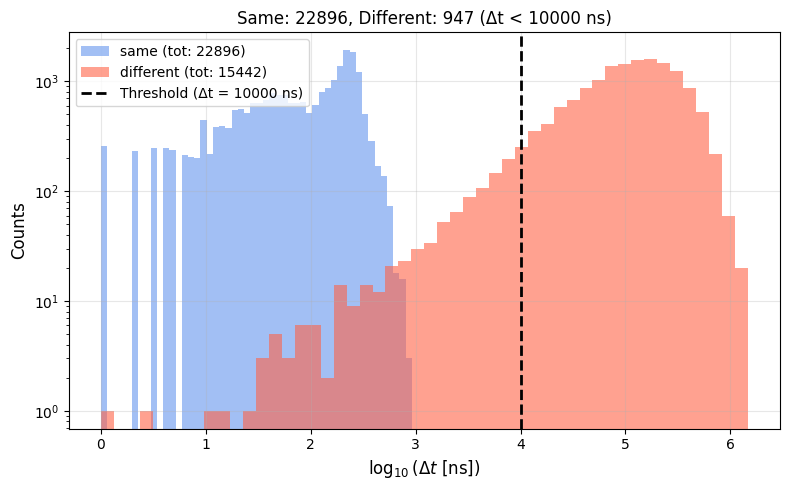

In [176]:
threshold_ns = 10000


#creazione dei time_group
df_all_sorted = df_all_sorted.sort_values('TIME_ABS').reset_index(drop=True)

#Calcolare le differenze temporali tra eventi consecutivi
df_all_sorted['dt'] = df_all_sorted['TIME_ABS'].diff()

# Creare gruppi temporali basati sulla soglia
# Quando dt > threshold_ns, inizia un nuovo gruppo
df_all_sorted['new_group'] = (df_all_sorted['dt'] > threshold_ns) | (df_all_sorted['dt'].isna())
df_all_sorted['time_group'] = df_all_sorted['new_group'].cumsum()


group_info = df_all_sorted.groupby('time_group').agg({
    'EVENT': 'nunique',
    'MCRUN': 'nunique'
}).reset_index()

group_info['is_mixed'] = (group_info['EVENT'] > 1) | (group_info['MCRUN'] > 1)

n_pure_groups = (~group_info['is_mixed']).sum()
n_mixed_groups = group_info['is_mixed'].sum()
total_groups = len(group_info)

print(f"\nTime groups (finestre temporali):")
print(f"  - Pure (stesso evento): {n_pure_groups} ({n_pure_groups/total_groups*100:.1f}%)")
print(f"  - Miste (eventi diversi): {n_mixed_groups} ({n_mixed_groups/total_groups*100:.1f}%)")
print(f"  - Totale groups: {total_groups}")
#### PLOTTT PER CAPIRE
delta_t_same_window = delta_t_same[(delta_t_same > 0) & (delta_t_same < threshold_ns)]
delta_t_diff_window = delta_t_diff[(delta_t_diff > 0) & (delta_t_diff < threshold_ns)]
n_same_in_window = len(delta_t_same_window)
n_diff_in_window = len(delta_t_diff_window)


#=========================== INSERISCO CONTROLLO TEMPI MORTI ===========================================
# Ordina per time_group TIME_ABS
df_all_sorted = df_all_sorted.sort_values(by=["time_group", "TIME_ABS"]).reset_index(drop=True)

# TIENE IL TELESCOPIO ARRIVATO PRIMA
df_all_sorted = df_all_sorted.drop_duplicates(subset=['time_group', 'TEL_ID'], keep='first').reset_index(drop=True)
##################################################################################à



plt.figure(figsize=(8, 5))
plt.hist(np.log10(delta_t_same[delta_t_same > 0]), bins=50, color='cornflowerblue',
         alpha=0.6, label=f'same (tot: {len(delta_t_same[delta_t_same > 0])})')
plt.hist(np.log10(delta_t_diff[delta_t_diff > 0]), bins=50, color='tomato',
         alpha=0.6, label=f'different (tot: {len(delta_t_diff[delta_t_diff > 0])})')

# Linea verticale alla soglia
plt.axvline(x=4, color='black', linestyle='--', linewidth=2, 
            label=f'Threshold (Δt = {threshold_ns} ns)')

plt.yscale('log')
plt.xlabel(r'$\log_{10}(\Delta t\ \mathrm{[ns]})$', fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title(f'Same: {n_same_in_window}, Different: {n_diff_in_window} (Δt < {threshold_ns} ns)')
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

In [177]:
#df_all_sorted=df_all_sorted[df_all_sorted["num_tel"]>=3] #il mio metodo non ha senso per due telescopi
# 4. Identificare se eventi consecutivi hanno stesso EVENT e MCRUN
df_all_sorted['same_event'] = (df_all_sorted['EVENT'] == df_all_sorted['EVENT'].shift(1))
df_all_sorted['same_mcrun'] = (df_all_sorted['MCRUN'] == df_all_sorted['MCRUN'].shift(1))
df_all_sorted['same_event_mcrun'] = df_all_sorted['same_event'] & df_all_sorted['same_mcrun']

# 5. Classificare gli eventi
# same_window: stessa finestra temporale E stesso EVENT/MCRUN
# diff_window: stessa finestra temporale MA EVENT o MCRUN diverso
df_all_sorted['window_type'] = None

# Eventi consecutivi nella stessa finestra temporale (dt <= threshold_ns)
same_time_window = ~df_all_sorted['new_group']

df_all_sorted.loc[same_time_window & df_all_sorted['same_event_mcrun'], 'window_type'] = 'same_window'
df_all_sorted.loc[same_time_window & ~df_all_sorted['same_event_mcrun'], 'window_type'] = 'diff_window'

# 6. Estrarre gli eventi di tipo diff_window
diff_window_events = df_all_sorted[df_all_sorted['window_type'] == 'diff_window']

# 7. Identificare tutti i time_group che contengono eventi diff_window
affected_time_groups = diff_window_events['time_group'].unique()
print(f"Numero totale di rette: {len(df_all_sorted)}")

# 8. Estrarre tutti gli eventi appartenenti a questi gruppi temporali
df_linked_events = df_all_sorted[df_all_sorted['time_group'].isin(affected_time_groups)].copy()

# 9. Pulizia: rimuovere colonne temporanee se necessario
df_all_sorted = df_all_sorted.drop(columns=['new_group', 'same_event', 'same_mcrun', 'same_event_mcrun'])


# Risultati
print(f"Numero totale di rette: {len(df_all_sorted)}")
print(f"Numero totale di eventi (event, mcrun): {df_all_sorted.groupby(['EVENT', 'MCRUN']).ngroups}")
print(f"Numero totale di eventi SEB : {df_all_sorted.groupby(['time_group']).ngroups}")
#print(df_linked_events['dt'].max())
#print(df_all_sorted['dt'].max())

#print(df_linked_events.columns)
print(f"Numero di finestre temporali: {df_all_sorted['time_group'].nunique()}")
print(f"rette in same_window: {(df_all_sorted['window_type'] == 'same_window').sum()}")
print(f"rette in diff_window: {(df_all_sorted['window_type'] == 'diff_window').sum()}")
print(f"Numero di finestre temporali con eventi misti: {len(affected_time_groups)}")
print(f"Numero totale di eventi SEB (in cui si può distinguere): {df_linked_events.groupby(['time_group']).ngroups}")
##################
unique_events = df_linked_events[['EVENT', 'MCRUN']].drop_duplicates()
n_unique_events = len(unique_events)

print(f"Eventi unici (EVENT, MCRUN) in df_linked_events: {n_unique_events}")


# Se vuoi anche statistiche dettagliate
print(f"\n{'='*70}")
print("STATISTICHE df_linked_events")
print(f"{'='*70}")
print(f"Righe totali (telescopi): {len(df_linked_events)}")
print(f"Time groups coinvolti: {df_linked_events['time_group'].nunique()}")
print(f"Eventi unici (EVENT, MCRUN): {n_unique_events}")


# Distribuzione eventi per time_group
events_per_group = df_linked_events.groupby('time_group')[['EVENT', 'MCRUN']].apply(
    lambda x: len(x.drop_duplicates())
)
print(f"\n{'='*70}")
print("DISTRIBUZIONE EVENTI PER TIME_GROUP")
print(f"{'='*70}")
print(f"Time groups con 1 evento: {(events_per_group == 1).sum()}")
print(f"Time groups con 2 eventi: {(events_per_group == 2).sum()}")
print(f"Time groups con 3+ eventi: {(events_per_group >= 3).sum()}")
print(f"Righe con dt < {threshold_ns}: {(df_linked_events['dt'] < threshold_ns).sum()}")
print(f"Righe con dt >= {threshold_ns}: {(df_linked_events['dt'] >= threshold_ns).sum()}")
print(f"Righe con dt NaN: {df_linked_events['dt'].isna().sum()}")

print("\nPrime 20 righe di df_linked_events:")
print(df_linked_events[['TIME_ABS', 'EVENT', 'MCRUN', 'dt']].head(20))

Numero totale di rette: 10224
Numero totale di rette: 10224
Numero totale di eventi (event, mcrun): 3672
Numero totale di eventi SEB : 3625
Numero di finestre temporali: 3625
rette in same_window: 6552
rette in diff_window: 47
Numero di finestre temporali con eventi misti: 47
Numero totale di eventi SEB (in cui si può distinguere): 47
Eventi unici (EVENT, MCRUN) in df_linked_events: 94

STATISTICHE df_linked_events
Righe totali (telescopi): 256
Time groups coinvolti: 47
Eventi unici (EVENT, MCRUN): 94

DISTRIBUZIONE EVENTI PER TIME_GROUP
Time groups con 1 evento: 0
Time groups con 2 eventi: 47
Time groups con 3+ eventi: 0
Righe con dt < 10000: 209
Righe con dt >= 10000: 47
Righe con dt NaN: 0

Prime 20 righe di df_linked_events:
     TIME_ABS  EVENT   MCRUN         dt
18    3209924   3309  220000    78780.0
19    3215202   3313  220000     5278.0
150  28301172  47607  220000   208396.0
151  28301251  47607  220000       79.0
152  28301518  47607  220000      267.0
153  28301525  47607 

In [178]:
dup_check = df_linked_events.groupby(['time_group', 'TEL_ID']).size()
print(f"Duplicati (time_group, TEL_ID): {(dup_check > 1).sum()}")
if (dup_check > 1).sum() > 0:
    print(" CI SONO DUPLICATI!")
    print(dup_check[dup_check > 1].head())

Duplicati (time_group, TEL_ID): 0


In [179]:
df_linked_events[df_linked_events['time_group'] == 957]

,TIME_NS,TIME_S,TIME_ABS,EVENT,MCRUN,TEL_ID,num_tel,HG,LG,TTP,shape,n_valid_pixels,dt,new_group,time_group,same_event,same_mcrun,same_event_mcrun,window_type
2585,628410920,0,628410920,18216,220026,9,1,"[[2146, 2178, 2189, 2197, 2221, 2261, 2129, 21...","[[2129, 2131, 2131, 2132, 2133, 2135, 2128, 21...","[[255, 138, 255, 255, 255, 255, 255, 255, 255,...",5160296,232,570528.0,True,957,False,True,False,None
2586,628415839,0,628415839,18901,220026,1,7,"[[2154, 2073, 2119, 2332, 2166, 2179, 2161, 21...","[[2129, 2125, 2128, 2138, 2130, 2131, 2130, 21...","[[255, 255, 255, 90, 255, 255, 255, 255, 255, ...",5267899,397,4919.0,False,957,False,True,False,diff_window
2587,628416114,0,628416114,18901,220026,2,7,"[[2217, 2222, 2190, 2115, 2084, 2225, 2321, 23...","[[2132, 2133, 2131, 2127, 2126, 2133, 2138, 21...","[[255, 255, 255, 255, 255, 255, 64, 57, 255, 2...",5260321,351,275.0,False,957,True,True,True,same_window
2588,628416153,0,628416153,18901,220026,4,7,"[[2741, 2370, 2492, 2424, 2417, 2263, 2086, 21...","[[2159, 2140, 2146, 2143, 2143, 2135, 2126, 21...","[[55, 61, 57, 58, 60, 68, 255, 255, 56, 58, 54...",5204224,266,39.0,False,957,True,True,True,same_window
2589,628416159,0,628416159,18901,220026,3,7,"[[2606, 2613, 2757, 3248, 4095, 4095, 4095, 40...","[[2152, 2152, 2160, 2184, 2258, 2343, 2397, 24...","[[59, 58, 59, 56, 55, 55, 55, 54, 0, 58, 56, 5...",5428996,503,6.0,False,957,True,True,True,same_window
2590,628416360,0,628416360,18901,220026,5,7,"[[2306, 2468, 2343, 2289, 2992, 4095, 4095, 32...","[[2137, 2145, 2139, 2136, 2171, 2337, 2258, 21...","[[60, 59, 62, 63, 58, 55, 55, 57, 26, 255, 61,...",5130068,175,201.0,False,957,True,True,True,same_window
2591,628416387,0,628416387,18901,220026,6,7,"[[3179, 4095, 4095, 3836, 2830, 2631, 2217, 21...","[[2181, 2262, 2474, 2213, 2163, 2153, 2132, 21...","[[56, 54, 54, 55, 54, 57, 255, 255, 57, 55, 55...",5137251,181,27.0,False,957,True,True,True,same_window


In [180]:
# Controlla se ci sono duplicati per (time_group, TEL_ID)
duplicati = df_linked_events.groupby(['time_group', 'TEL_ID']).size()
duplicati_multipli = duplicati[duplicati > 1]

print(f"Combinazioni (time_group, TEL_ID) duplicate: {len(duplicati_multipli)}")
if len(duplicati_multipli) > 0:
    print("\nPrimi 10 esempi di duplicati:")
    print(duplicati_multipli.head(10))
    
    # Analizza un caso specifico
    primo_caso = duplicati_multipli.index[0]
    tg, tel = primo_caso
    print(f"\n{'='*80}")
    print(f"ESEMPIO: time_group={tg}, TEL_ID={tel} (compare {duplicati_multipli.iloc[0]} volte)")
    print(f"{'='*80}")
    df_esempio = df_linked_events[(df_linked_events['time_group'] == tg) & 
                                   (df_linked_events['TEL_ID'] == tel)]
    print(df_esempio[['TIME_ABS', 'TIME_NS', 'TIME_S', 'EVENT', 'MCRUN', 'TEL_ID', 'dt', 'window_type']])

Combinazioni (time_group, TEL_ID) duplicate: 0


In [181]:
# Filtra time_group con almeno 3 telescopi
telescopi_per_group = df_linked_events.groupby('time_group').size()
time_groups_validi = telescopi_per_group[telescopi_per_group >= 3].index

print(f"Time groups prima del filtro: {df_linked_events['time_group'].nunique()}")
print(f"Time groups con almeno 3 telescopi: {len(time_groups_validi)}")
print(f"Time groups rimossi: {df_linked_events['time_group'].nunique() - len(time_groups_validi)}")

# Applica il filtro
df_linked_events = df_linked_events[df_linked_events['time_group'].isin(time_groups_validi)].copy()

print(f"\nDopo il filtro:")
print(f"Numero totale di rette: {len(df_linked_events)}")
print(f"Numero di time_group: {df_linked_events['time_group'].nunique()}")

# Controllo sui time_group con più di 9 telescopi
telescopi_per_group_filtered = df_linked_events.groupby('time_group').size()
time_groups_oltre_9 = telescopi_per_group_filtered[telescopi_per_group_filtered > 9]

print(f"\n{'='*60}")
print(f"Time groups con più di 9 telescopi: {len(time_groups_oltre_9)}")
if len(time_groups_oltre_9) > 0:
    print(f"\nDettaglio:")
    for tg, n_tel in time_groups_oltre_9.items():
        print(f"  Time group {tg}: {n_tel} telescopi")
print(f"{'='*60}")

# Statistiche distribuzione telescopi per time_group
print(f"\nDistribuzione telescopi per time_group:")
print(f"  Min: {telescopi_per_group_filtered.min()}")
print(f"  Max: {telescopi_per_group_filtered.max()}")
print(f"  Media: {telescopi_per_group_filtered.mean():.2f}")
print(f"  Mediana: {telescopi_per_group_filtered.median():.0f}")

Time groups prima del filtro: 47
Time groups con almeno 3 telescopi: 42
Time groups rimossi: 5

Dopo il filtro:
Numero totale di rette: 246
Numero di time_group: 42

Time groups con più di 9 telescopi: 0

Distribuzione telescopi per time_group:
  Min: 3
  Max: 9
  Media: 5.86
  Mediana: 6


In [182]:
def analizza_time_group(tg_number):
    """
    Analizza e stampa il DataFrame di un singolo time_group
    """
    df_tg = df_linked_events[df_linked_events['time_group'] == tg_number].copy()
    
    if len(df_tg) == 0:
        print(f" Time group {tg_number} non trovato!")
        return None
    
    print(f"\n{'='*80}")
    print(f"TIME GROUP {tg_number}")
    print(f"{'='*80}")
    print(f"Numero telescopi: {len(df_tg)}")
    print(f"Eventi MC: {sorted(df_tg['EVENT'].unique().tolist())}")
    print(f"MCRUN: {sorted(df_tg['MCRUN'].unique().tolist())}")
    print(f"{'='*80}\n")
    
    # Mostra il DataFrame
    display(df_tg)
    
    return df_tg

# Uso:
# analizza_time_group(69)  # esempio
# oppure per più time_group:
# for tg in [69, 120, 450]:
#     analizza_time_group(tg)
analizza_time_group(941)

 Time group 941 non trovato!


In [183]:
#inizio l'analisi con il mio metodo
# ======================= FUNZIONI GEOMETRICHE =======================

def intersection(p1, d1, p2, d2, eps_ang=1e-1, eps_det=1e-6):
    """
    p1, p2 = punti (2,)
    d1, d2 = direzioni (2,)
    """

    # --- controllo quasi-parallelismo ---
    det_dir = d1[0]*d2[1] - d1[1]*d2[0]
    if abs(det_dir) < eps_ang:        # <<< taglio fisico
        return None

    A = np.array([d1, -d2]).T
    b = p2 - p1

    detA = np.linalg.det(A)
    if abs(detA) < eps_det:           # <<< sicurezza numerica
        return None

    t = np.linalg.solve(A, b)[0]
    return p1 + t * d1
def d_punto_retta(P, p0, d):
    norm_d = np.linalg.norm(d)
    if norm_d == 0:
        return np.nan
    d_unit = d / norm_d
    v = P - p0
    return abs(v[0] * d_unit[1] - v[1] * d_unit[0])
def d_punto_retta_vec(P, p0, d):
    """
    distanza di N rette da un punto
    """
    norm_d = np.linalg.norm(d, axis=1)
    mask = norm_d > 0
    d_unit = np.zeros_like(d)
    d_unit[mask] = d[mask] / norm_d[mask, None]
    v = P - p0
    return np.abs(v[:, 0] * d_unit[:, 1] - v[:, 1] * d_unit[:, 0])


In [184]:

def principal_axis(cov):
            l1 = (cov[0,0] + cov[1,1])/2 + np.sqrt(
                ((cov[0,0] - cov[1,1])/2)**2 + cov[0,1]**2)
            theta = np.arctan2(l1 - cov[0,0], cov[0,1])
            return l1, theta
#raccolgo i dati delle rette divisi per ogni (event,mcrun)
#df_all_sorted=df_all_sorted[df_all_sorted["shape"]>5.16e6]
#df_all_sorted=df_all_sorted[df_all_sorted["num_tel"]>=3]



xfp, yfp = at.utils.camera.get_xy_footprint()
y_pix, x_pix = at.utils.camera.get_pixels_position_matrix().T
x_pix = at.reshape(x_pix)
y_pix = at.reshape(y_pix)

results = []

for time_group, df_evt in df_linked_events.groupby('time_group'):
    
    for iv, row in df_evt.iterrows():

        itel = row["TEL_ID"]
        event = row["EVENT"]     
        mcrun = row["MCRUN"]     
        
        hgev = np.array(row["HG"])
        lgev = np.array(row["LG"])
        ttpev = np.array(row["TTP"])

        # filtro temporale
        pxmask = (hgev > 2400) & (ttpev < 255)
        if np.sum(pxmask) < 2:
            continue
        
        # SIGMA-CLIPPING
        xx = x_pix[pxmask].flatten()
        yy = y_pix[pxmask].flatten()
        w_hg = hgev[pxmask].flatten()
        w_lg = lgev[pxmask].flatten()

        mx0 = np.average(xx, weights=w_hg)
        my0 = np.average(yy, weights=w_hg)

        r = np.sqrt((xx - mx0)**2 + (yy - my0)**2)

        r_clip, low, high = sc.sigmaclip(r, low=2., high=2.)
        keep = (r >= low) & (r <= high)

        xx_sc = xx[keep]
        yy_sc = yy[keep]
        w_hg_sc = w_hg[keep]
        w_lg_sc = w_lg[keep]
        
        # ---------- centroidi ----------
        meanx_hg = np.average(xx_sc, weights=w_hg_sc)
        meany_hg = np.average(yy_sc, weights=w_hg_sc)

        meanx_lg = np.average(xx_sc, weights=w_lg_sc)
        meany_lg = np.average(yy_sc, weights=w_lg_sc)

        # ---------- covarianze ----------
        cov_hg = np.cov([xx_sc, yy_sc], aweights=w_hg_sc)
        cov_lg = np.cov([xx_sc, yy_sc], aweights=w_lg_sc)

        l1_hg, theta_hg = principal_axis(cov_hg)
        l1_lg, theta_lg = principal_axis(cov_lg)

        results.append({
            "time_group": int(time_group),
            "event": int(event),      
            "mcrun": int(mcrun),      
            "HG": {
                "p0": np.array([meanx_hg, meany_hg]),
                "d":  np.array([np.cos(theta_hg), np.sin(theta_hg)]),
                "l1": l1_hg,
                "tel": int(itel)       
            },
            "LG": {
                "p0": np.array([meanx_lg, meany_lg]),
                "d":  np.array([np.cos(theta_lg), np.sin(theta_lg)]),
                "l1": l1_lg,
                "tel": int(itel)       
            }
        })

print(f"Creati {len(results)} risultati")
dfR = pd.DataFrame(results)
print(dfR.columns)
print(len(dfR["time_group"].unique()))

Creati 245 risultati
Index(['time_group', 'event', 'mcrun', 'HG', 'LG'], dtype='object')
42


In [185]:
# Time groups in df_linked_events
time_groups_linked = set(df_linked_events['time_group'].unique())

# Time groups in dfR
time_groups_dfR = set(dfR['time_group'].unique())

# Time groups mancanti (presenti in df_linked_events ma non in dfR)
missing_time_groups = time_groups_linked - time_groups_dfR

print(f"Time groups in df_linked_events: {len(time_groups_linked)}")
print(f"Time groups in dfR: {len(time_groups_dfR)}")
print(f"Time groups mancanti: {len(missing_time_groups)}")
print(f"\nLista time groups mancanti: {sorted(missing_time_groups)}")

# Analizza perché sono mancanti
print(f"\n{'='*70}")
print("ANALISI TIME GROUPS MANCANTI")
print(f"{'='*70}")

for tg in sorted(missing_time_groups):
    df_missing = df_linked_events[df_linked_events['time_group'] == tg]
    
    # Conta quanti avevano troppo pochi pixel
    n_total = len(df_missing)
    
    print(f"\nTime Group {tg}:")
    print(f"  Telescopi totali: {n_total}")
    print(f"  Eventi: {df_missing['EVENT'].unique()}")
    print(f"  MCRUN: {df_missing['MCRUN'].unique()}")
    
    # Verifica manualmente quanti avrebbero passato il filtro pxmask
    n_passed = 0
    for _, row in df_missing.iterrows():
        hgev = np.array(row["HG"])
        ttpev = np.array(row["TTP"])
        pxmask = (hgev > 2400) & (ttpev < 255)
        if np.sum(pxmask) >= 2:
            n_passed += 1
    
    print(f"  Telescopi che passano pxmask (>2 pixel): {n_passed}")
    print(f"  Telescopi filtrati: {n_total - n_passed}")

Time groups in df_linked_events: 42
Time groups in dfR: 42
Time groups mancanti: 0

Lista time groups mancanti: []

ANALISI TIME GROUPS MANCANTI


In [186]:
# 3. CALCOLO INTERSEZIONI CORRETTO
# =====================================================================

inters_hg = []
inters_lg = []

for time_group, df_evt in dfR.groupby('time_group'):

    # Converti in liste per accesso più facile
    rows = df_evt.to_dict('records')
    
    # ---------- HG ----------
    for i in range(len(rows)):
        for j in range(i+1, len(rows)):
            
            r1 = rows[i]["HG"]
            r2 = rows[j]["HG"]
            
            P = intersection(r1["p0"], r1["d"], r2["p0"], r2["d"])
            
            if P is None:
                continue
            
            # Salva con riferimenti alle rette (tel, event, mcrun)
            inters_hg.append({
                "time_group": time_group,
                "tel1": r1["tel"],
                "tel2": r2["tel"],
                "event1": rows[i]["event"],
                "event2": rows[j]["event"],
                "mcrun1": rows[i]["mcrun"],
                "mcrun2": rows[j]["mcrun"],
                "d1": r1["d"],
                "d2": r2["d"],
                "P": P
            })

    # ---------- LG ----------
    for i in range(len(rows)):
        for j in range(i+1, len(rows)):
            
            r1 = rows[i]["LG"]
            r2 = rows[j]["LG"]
            
            P = intersection(r1["p0"], r1["d"], r2["p0"], r2["d"])
            
            if P is None:
                continue
            
            inters_lg.append({
                "time_group": time_group,
                "tel1": r1["tel"],
                "tel2": r2["tel"],
                "event1": rows[i]["event"],
                "event2": rows[j]["event"],
                "mcrun1": rows[i]["mcrun"],
                "mcrun2": rows[j]["mcrun"],
                "d1": r1["d"],
                "d2": r2["d"],
                "P": P
            })

df_int_hg = pd.DataFrame(inters_hg)
df_int_lg = pd.DataFrame(inters_lg)

print(f"\nIntersezioni HG: {len(df_int_hg)}")
print(f"Intersezioni LG: {len(df_int_lg)}")
#'''
print(f"\nIntersezioni HG: {len(df_int_hg)}")
print(f"Intersezioni LG: {len(df_int_lg)}")
print(len(df_int_hg["time_group"].unique()))


Intersezioni HG: 625
Intersezioni LG: 626

Intersezioni HG: 625
Intersezioni LG: 626
42


In [187]:
for tg, df_evt in dfR.groupby("time_group"):
    print(f"time_group{tg} ha {len(df_evt)} rette, telescopi: {df_evt['HG'].apply(lambda r: r['tel']).tolist()}")

print("eventi temporali: ",len(dfR["time_group"].unique()))
n_tel_per_event = dfR.groupby("time_group").apply(
    lambda g: pd.unique(
        np.concatenate([g['HG'].apply(lambda x: x['tel']),
                        g['LG'].apply(lambda x: x['tel'])])
    ).size
)

# numero di eventi con un solo telescopio
n_eventi_un_tel = (n_tel_per_event == 1).sum()
print("eventi temporali che hanno un telescopio solo:", n_eventi_un_tel)
duplicati_count = 0
for tg, df_evt in dfR.groupby("time_group"):
    telescopi = df_evt['HG'].apply(lambda r: r['tel']).tolist()
    if len(telescopi) != len(set(telescopi)):
        duplicati_count += 1

print(f"Time_group con telescopi duplicati: {duplicati_count}")

time_group52 ha 6 rette, telescopi: [7, 6, 9, 8, 1, 2]
time_group124 ha 5 rette, telescopi: [1, 2, 3, 4, 7]
time_group132 ha 7 rette, telescopi: [4, 7, 6, 1, 2, 3, 5]
time_group424 ha 9 rette, telescopi: [4, 2, 3, 5, 6, 7, 8, 9, 1]
time_group441 ha 7 rette, telescopi: [4, 3, 5, 6, 7, 8, 9]
time_group457 ha 5 rette, telescopi: [1, 6, 5, 8, 9]
time_group582 ha 6 rette, telescopi: [9, 2, 4, 3, 5, 6]
time_group741 ha 5 rette, telescopi: [2, 3, 5, 8, 9]
time_group794 ha 4 rette, telescopi: [2, 3, 5, 1]
time_group808 ha 8 rette, telescopi: [2, 3, 4, 5, 6, 7, 8, 9]
time_group810 ha 6 rette, telescopi: [8, 9, 3, 5, 6, 7]
time_group957 ha 7 rette, telescopi: [9, 1, 2, 4, 3, 5, 6]
time_group998 ha 6 rette, telescopi: [2, 3, 5, 6, 8, 1]
time_group1094 ha 3 rette, telescopi: [8, 9, 4]
time_group1280 ha 4 rette, telescopi: [6, 8, 9, 5]
time_group1421 ha 8 rette, telescopi: [2, 4, 3, 5, 6, 1, 7, 8]
time_group1436 ha 3 rette, telescopi: [4, 6, 7]
time_group1534 ha 9 rette, telescopi: [1, 2, 3, 5, 4, 

/tmp/ipykernel_709958/1765511758.py:5: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  n_tel_per_event = dfR.groupby("time_group").apply(


In [188]:
from sklearn.cluster import DBSCAN
epsilon = 295
min_samples = 1

# ======================= HG =======================
dist_hg = []

for time_group, df_evt in df_int_hg.groupby("time_group"):

    P = np.vstack(df_evt["P"].values)
    if P.shape[0] < min_samples:
        continue

    # clustering DBSCAN
    labels = DBSCAN(eps=epsilon, min_samples=min_samples).fit_predict(P)
    cl_labels = set(labels) - {-1}
    if not cl_labels:
        continue

    # Rette del time_group
    dfR_evt = dfR[dfR["time_group"] == time_group]
    
    # CREA DIZIONARIO tel -> (event, mcrun)
    tel_to_event = {}
    for _, row in dfR_evt.iterrows():
        tel_id = row["HG"]["tel"]
        tel_to_event[tel_id] = (row["event"], row["mcrun"])
    
    # Estrai parametri rette
    p0 = np.vstack([r["p0"] for r in dfR_evt["HG"]])
    d = np.vstack([r["d"] for r in dfR_evt["HG"]])
    tel = np.array([r["tel"] for r in dfR_evt["HG"]])

    # ciclo cluster
    for lab in cl_labels:
        Pcl = P[labels == lab]
        dfP = df_evt[labels == lab]

        # ---------- calcolo pesi angolari ----------
        w = []
        for _, row in dfP.iterrows():
            d1 = row["d1"]
            d2 = row["d2"]
            w.append((d1[0]*d2[1] - d1[1]*d2[0])**2)   # sin^2(theta)

        w = np.array(w)

        # ---------- media pesata e semplice ----------
        P_simple = np.mean(Pcl, axis=0)
        P_weight = np.average(Pcl, axis=0, weights=w)
        P_median = np.median(Pcl, axis=0)

        dist_mean_simple = d_punto_retta_vec(P_simple, p0, d)
        dist_mean_weighted = d_punto_retta_vec(P_weight, p0, d)
        dist_median = d_punto_retta_vec(P_median, p0, d)
        
        # Per ogni retta, prendi il SUO event e mcrun
        for t, dm_s, dm_w, dmed in zip(tel, dist_mean_simple, dist_mean_weighted, dist_median):
            
            # Estrai event e mcrun SPECIFICI di questa retta
            evt, mc = tel_to_event[int(t)]
            
            dist_hg.append({
                "time_group": int(time_group),
                "event": int(evt),
                "mcrun": int(mc),
                "cluster": int(lab),
                "tel": int(t),
                "P_simple": P_simple.copy(),
                "P_weight": P_weight.copy(),
                "P_median": P_median.copy(),
                "d_mean_simple": float(dm_s),
                "d_weight": float(dm_w),
                "d_median": float(dmed)
            })

df_dist_hg = pd.DataFrame(dist_hg)


# ======================= LG =======================
dist_lg = []

for time_group, df_evt in df_int_lg.groupby("time_group"):

    P = np.vstack(df_evt["P"].values)
    if P.shape[0] < min_samples:
        continue

    labels = DBSCAN(eps=epsilon, min_samples=min_samples).fit_predict(P)
    cl_labels = set(labels) - {-1}
    if not cl_labels:
        continue

    # Rette del time_group
    dfR_evt = dfR[dfR["time_group"] == time_group]
    
    # CREA DIZIONARIO tel -> (event, mcrun)
    tel_to_event = {}
    for _, row in dfR_evt.iterrows():
        tel_id = row["LG"]["tel"]
        tel_to_event[tel_id] = (row["event"], row["mcrun"])
    
    # Estrai parametri rette
    p0 = np.vstack([r["p0"] for r in dfR_evt["LG"]])
    d = np.vstack([r["d"] for r in dfR_evt["LG"]])
    tel = np.array([r["tel"] for r in dfR_evt["LG"]])

    for lab in cl_labels:
        Pcl = P[labels == lab]
        dfP = df_evt[labels == lab]

        w = []
        for _, row in dfP.iterrows():
            d1 = row["d1"]
            d2 = row["d2"]
            w.append((d1[0]*d2[1] - d1[1]*d2[0])**2)

        w = np.array(w)

        P_simple = np.mean(Pcl, axis=0)
        P_weight = np.average(Pcl, axis=0, weights=w)
        P_median = np.median(Pcl, axis=0)

        dist_mean_simple = d_punto_retta_vec(P_simple, p0, d)
        dist_mean_weighted = d_punto_retta_vec(P_weight, p0, d)
        dist_median = d_punto_retta_vec(P_median, p0, d)
        
        # Per ogni retta, prendi il SUO event e mcrun
        for t, dm_s, dm_w, dmed in zip(tel, dist_mean_simple, dist_mean_weighted, dist_median):
            
            # Estrai event e mcrun SPECIFICI di questa retta
            evt, mc = tel_to_event[int(t)]
            
            dist_lg.append({
                "time_group": int(time_group),
                "event": int(evt),
                "mcrun": int(mc),
                "cluster": int(lab),
                "tel": int(t),
                "P_simple": P_simple.copy(),
                "P_weight": P_weight.copy(),
                "P_median": P_median.copy(),
                "d_mean_simple": float(dm_s),
                "d_weight": float(dm_w),
                "d_median": float(dmed)
            })

df_dist_lg = pd.DataFrame(dist_lg)
print(len(df_dist_hg["time_group"].unique()))
print(len(df_dist_lg["time_group"].unique()))
# Assicurati che i tipi siano uguali
df_linked_events['TEL_ID'] = df_linked_events['TEL_ID'].astype(int)
df_linked_events['EVENT'] = df_linked_events['EVENT'].astype(int)
df_linked_events['MCRUN'] = df_linked_events['MCRUN'].astype(int)

df_dist_hg['tel'] = df_dist_hg['tel'].astype(int)
df_dist_hg['event'] = df_dist_hg['event'].astype(int)
df_dist_hg['mcrun'] = df_dist_hg['mcrun'].astype(int)
######## AGGIUNGO PUNTO- MEDIANA#################################################
# Rinomina le colonne in df_dist_hg per farle coincidere
df_dist_hg_renamed = df_dist_hg.rename(columns={
    'tel': 'TEL_ID',
    'event': 'EVENT',
    'mcrun': 'MCRUN'
})


42
42


In [189]:
# ======================= ASSEGNAZIONE CLUSTER PER HG =======================

def assign_clusters(df_dist, threshold=60):
    """
    Assegna ogni retta al cluster più vicino se distanza <= threshold.
    Altrimenti marca come non assegnata.
    """
    results = []
    
    # Raggruppa per (time_group, ogni combinazione è una retta unica######################################
    for (tg, tel), group in df_dist.groupby(['time_group', 'tel']):
        
        # Trova il cluster con distanza minima
        idx_min = group['d_median'].idxmin()
        min_dist = group.loc[idx_min, 'd_median']
        best_cluster = group.loc[idx_min, 'cluster']
        
        # Prendi le altre info (event, mcrun sono uguali per questa retta)
        event = group.loc[idx_min, 'event']
        mcrun = group.loc[idx_min, 'mcrun']
        P_median = group.loc[idx_min, 'P_median']
        P_weight = group.loc[idx_min, 'P_weight']      
        
        # Assegna o marca come non assegnata
        if min_dist <= threshold:
            assigned_cluster = best_cluster
            is_assigned = True
        else:
            assigned_cluster = -1  # -1 indica "non assegnato"
            is_assigned = False
        if isinstance(event, np.ndarray):
            event = int(event[0]) if len(event) > 0 else -1
        else:
            event = int(event)
            
        if isinstance(mcrun, np.ndarray):
            mcrun = int(mcrun[0]) if len(mcrun) > 0 else -1
        else:
            mcrun = int(mcrun)
        results.append({
           
            'time_group': int(tg),
            'tel': int(tel),
            'event': int(event) if event is not None else -1,
            'mcrun': int(mcrun) if mcrun is not None else -1,
            'assigned_cluster': assigned_cluster,
            'is_assigned': is_assigned,
            'min_distance': min_dist,
            'n_clusters_available': len(group),  # quanti cluster erano disponibili
            'P_median': P_median,      
            'P_weight': P_weight
        })
    
    return pd.DataFrame(results)

# Applica l'assegnazione
df_assigned_hg = assign_clusters(df_dist_hg, threshold=60)
df_assigned_lg = assign_clusters(df_dist_lg, threshold=60)

# ======================= STATISTICHE =======================

print("="*70)
print("HG - Statistiche assegnazione")
print("="*70)
print(f"Rette totali: {len(df_assigned_hg)}")
print(f"Rette assegnate: {df_assigned_hg['is_assigned'].sum()}")
print(f"Rette non assegnate: {(~df_assigned_hg['is_assigned']).sum()}")
print(f"Percentuale assegnate: {100*df_assigned_hg['is_assigned'].mean():.1f}%")
print(f"\nDistribuzione cluster assegnati:")
print(df_assigned_hg[df_assigned_hg['is_assigned']]['assigned_cluster'].value_counts().sort_index())

print("\n" + "="*70)
print("LG - Statistiche assegnazione")
print("="*70)
print(f"Rette totali: {len(df_assigned_lg)}")
print(f"Rette assegnate: {df_assigned_lg['is_assigned'].sum()}")
print(f"Rette non assegnate: {(~df_assigned_lg['is_assigned']).sum()}")
print(f"Percentuale assegnate: {100*df_assigned_lg['is_assigned'].mean():.1f}%")
print(f"\nDistribuzione cluster assegnati:")
print(df_assigned_lg[df_assigned_lg['is_assigned']]['assigned_cluster'].value_counts().sort_index())


HG - Statistiche assegnazione
Rette totali: 245
Rette assegnate: 240
Rette non assegnate: 5
Percentuale assegnate: 98.0%

Distribuzione cluster assegnati:
assigned_cluster
0    215
1     16
2      5
3      2
4      2
Name: count, dtype: int64

LG - Statistiche assegnazione
Rette totali: 245
Rette assegnate: 240
Rette non assegnate: 5
Percentuale assegnate: 98.0%

Distribuzione cluster assegnati:
assigned_cluster
0    213
1     17
2      5
3      3
4      2
Name: count, dtype: int64


In [190]:
df_assigned_hg = assign_clusters(df_dist_hg, threshold=60)

# POI fai il merge principale includendo le colonne P_median, P_weight nel df_assigned
# (già presenti in df_assigned_hg se hai modificato assign_clusters come ti ho suggerito)

df_merged = pd.merge(
    df_linked_events, 
    df_assigned_hg,  # Questo contiene già P_median, P_weight per il cluster assegnato
    left_on=['TEL_ID', 'time_group', 'EVENT', 'MCRUN'],
    right_on=['tel', 'time_group', 'event', 'mcrun'],
    how='inner'
)

df_merged = df_merged.drop(columns=['tel', 'event', 'mcrun'])
df_merged.columns

Index(['TIME_NS', 'TIME_S', 'TIME_ABS', 'EVENT', 'MCRUN', 'TEL_ID', 'num_tel',
       'HG', 'LG', 'TTP', 'shape', 'n_valid_pixels', 'dt', 'new_group',
       'time_group', 'same_event', 'same_mcrun', 'same_event_mcrun',
       'window_type', 'assigned_cluster', 'is_assigned', 'min_distance',
       'n_clusters_available', 'P_median', 'P_weight'],
      dtype='object')

In [191]:

for fevent, df_evt in dfR.groupby("time_group"):
    n_telescopi = len(df_evt)  # Numero di righe = numero di telescopi
    telescopi = df_evt['HG'].apply(lambda r: r['tel']).tolist()
    print(f"time_group {fevent} ha {n_telescopi} rette, telescopi: {telescopi}")

print("\nFiltraggio")

for fevent, df_evt in dfR.groupby("time_group"):
    n_telescopi = len(df_evt)
    telescopi = df_evt['HG'].apply(lambda r: r['tel']).tolist()
    print(f"time_group {fevent} ha {n_telescopi} rette, telescopi: {telescopi}")

# Numero massimo di telescopi in un singolo time_group
max_telescopi_per_group = dfR.groupby("time_group").size().max()
print(f"\nMax telescopi in un time_group: {max_telescopi_per_group}")

# Oppure per df_linked_events
max_telescopi_linked = df_linked_events.groupby("time_group").size().max()
print(f"Max telescopi in df_linked_events: {max_telescopi_linked}")

# Per vedere quale time_group ha il massimo
telescopi_counts = dfR.groupby("time_group").size()
time_group_max = telescopi_counts.idxmax()
print(f"Time_group con più telescopi: {time_group_max} ({telescopi_counts.max()} telescopi)")

time_group 52 ha 6 rette, telescopi: [7, 6, 9, 8, 1, 2]
time_group 124 ha 5 rette, telescopi: [1, 2, 3, 4, 7]
time_group 132 ha 7 rette, telescopi: [4, 7, 6, 1, 2, 3, 5]
time_group 424 ha 9 rette, telescopi: [4, 2, 3, 5, 6, 7, 8, 9, 1]
time_group 441 ha 7 rette, telescopi: [4, 3, 5, 6, 7, 8, 9]
time_group 457 ha 5 rette, telescopi: [1, 6, 5, 8, 9]
time_group 582 ha 6 rette, telescopi: [9, 2, 4, 3, 5, 6]
time_group 741 ha 5 rette, telescopi: [2, 3, 5, 8, 9]
time_group 794 ha 4 rette, telescopi: [2, 3, 5, 1]
time_group 808 ha 8 rette, telescopi: [2, 3, 4, 5, 6, 7, 8, 9]
time_group 810 ha 6 rette, telescopi: [8, 9, 3, 5, 6, 7]
time_group 957 ha 7 rette, telescopi: [9, 1, 2, 4, 3, 5, 6]
time_group 998 ha 6 rette, telescopi: [2, 3, 5, 6, 8, 1]
time_group 1094 ha 3 rette, telescopi: [8, 9, 4]
time_group 1280 ha 4 rette, telescopi: [6, 8, 9, 5]
time_group 1421 ha 8 rette, telescopi: [2, 4, 3, 5, 6, 1, 7, 8]
time_group 1436 ha 3 rette, telescopi: [4, 6, 7]
time_group 1534 ha 9 rette, telescopi

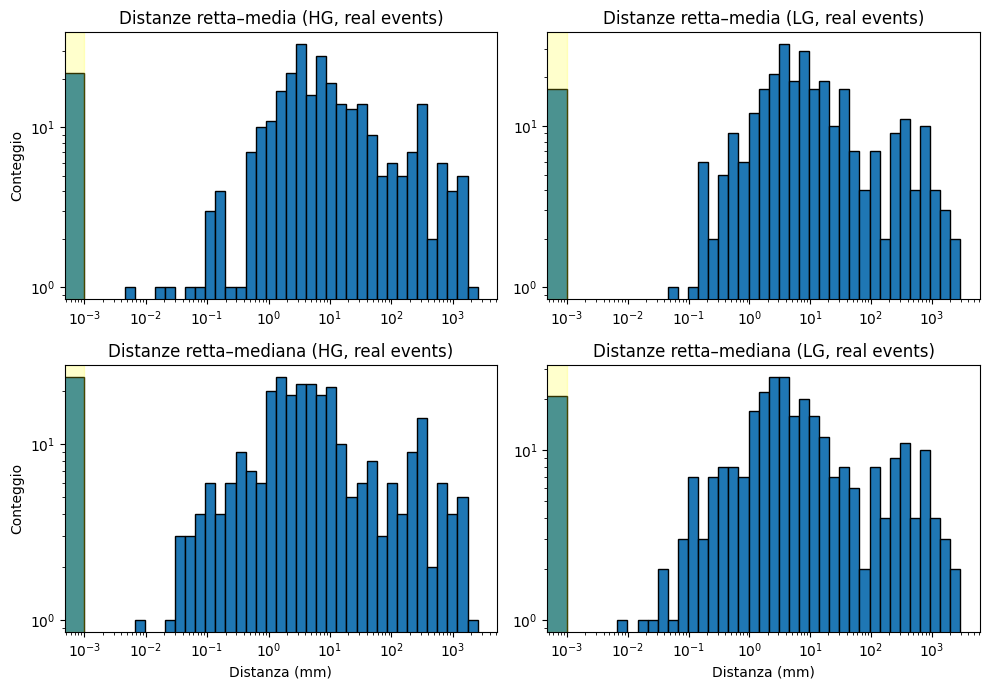

Index(['TIME_NS', 'TIME_S', 'TIME_ABS', 'EVENT', 'MCRUN', 'TEL_ID', 'num_tel',
       'HG', 'LG', 'TTP', 'shape', 'n_valid_pixels', 'dt', 'new_group',
       'time_group', 'same_event', 'same_mcrun', 'same_event_mcrun',
       'window_type'],
      dtype='object')


In [192]:

# ===================== ESTRAZIONE DISTANZE =====================
d_mean_hg   = df_dist_hg["d_weight"].values
d_median_hg = df_dist_hg["d_median"].values
d_mean_lg  = df_dist_lg["d_weight"].values
d_median_lg = df_dist_lg["d_median"].values

# filtro valori validi (>0 e finiti)
d_mean_hg   = d_mean_hg[np.isfinite(d_mean_hg) & (d_mean_hg > 0)]
d_median_hg = d_median_hg[np.isfinite(d_median_hg) & (d_median_hg > 0)]
d_mean_lg   = d_mean_lg[np.isfinite(d_mean_lg) & (d_mean_lg > 0)]
d_median_lg = d_median_lg[np.isfinite(d_median_lg) & (d_median_lg > 0)]

# -------------------- BINS LOGARITMICI SEPARATI --------------------
def smart_bins(data, n_bins=40, zero_threshold=0.001):
    """Crea bins logaritmici + bin speciale per valori ~0"""
    bin_zero = [0, zero_threshold]
    log_bins = np.logspace(np.log10(zero_threshold), np.log10(data.max()*1.1), n_bins)
    return np.unique(np.concatenate([bin_zero, log_bins]))

bins_mean_hg   = smart_bins(d_mean_hg)
bins_median_hg = smart_bins(d_median_hg)
bins_mean_lg   = smart_bins(d_mean_lg)
bins_median_lg = smart_bins(d_median_lg)

# ===================== PLOT =====================
fig, axes = plt.subplots(2, 2, figsize=(10, 7), sharex=False, sharey=False)

# -------------------- HG --------------------
axes[0,0].hist(d_mean_hg, bins=bins_mean_hg, edgecolor='black')
axes[0,0].set_title("Distanze retta–media (HG, real events)")
axes[0,0].set_ylabel("Conteggio")

axes[1,0].hist(d_median_hg, bins=bins_median_hg, edgecolor='black')
axes[1,0].set_title("Distanze retta–mediana (HG, real events)")
axes[1,0].set_ylabel("Conteggio")
axes[1,0].set_xlabel("Distanza (mm)")

# -------------------- LG --------------------
axes[0,1].hist(d_mean_lg, bins=bins_mean_lg, edgecolor='black')
axes[0,1].set_title("Distanze retta–media (LG, real events)")

axes[1,1].hist(d_median_lg, bins=bins_median_lg, edgecolor='black')
axes[1,1].set_title("Distanze retta–mediana (LG, real events)")
axes[1,1].set_xlabel("Distanza (mm)")

# scala log su entrambi gli assi
for ax in axes.flat:
    ax.axvspan(0, 0.001, alpha=0.2, color='yellow')
    ax.set_xscale("log")
    ax.set_yscale("log")

plt.tight_layout()
plt.show()
print(df_linked_events.columns)

In [193]:
# ======================= ASSEGNAZIONE CLUSTER PER HG =======================

def assign_clusters(df_dist, threshold=60):
    """
    Assegna ogni retta al cluster più vicino se distanza <= threshold.
    Altrimenti marca come non assegnata.
    """
    results = []
    
    # Raggruppa per (time_group, ogni combinazione è una retta unica######################################
    for (tg, tel), group in df_dist.groupby(['time_group', 'tel']):
        
        # Trova il cluster con distanza minima
        idx_min = group['d_median'].idxmin()
        min_dist = group.loc[idx_min, 'd_median']
        best_cluster = group.loc[idx_min, 'cluster']
        
        # Prendi le altre info (event, mcrun sono uguali per questa retta)
        event = group.loc[idx_min, 'event']
        mcrun = group.loc[idx_min, 'mcrun']
        P_median = group.loc[idx_min, 'P_median']
        
        # Assegna o marca come non assegnata
        if min_dist <= threshold:
            assigned_cluster = best_cluster
            is_assigned = True
        else:
            assigned_cluster = -1  # -1 indica "non assegnato"
            is_assigned = False
        if isinstance(event, np.ndarray):
            event = int(event[0]) if len(event) > 0 else -1
        else:
            event = int(event)
            
        if isinstance(mcrun, np.ndarray):
            mcrun = int(mcrun[0]) if len(mcrun) > 0 else -1
        else:
            mcrun = int(mcrun)
        results.append({
           
            'time_group': int(tg),
            'tel': int(tel),
            'event': int(event) if event is not None else -1,
            'mcrun': int(mcrun) if mcrun is not None else -1,
            'assigned_cluster': assigned_cluster,
            'is_assigned': is_assigned,
            'min_distance': min_dist,
            'n_clusters_available': len(group)  # quanti cluster erano disponibili
        })
    
    return pd.DataFrame(results)

# Applica l'assegnazione
df_assigned_hg = assign_clusters(df_dist_hg, threshold=60)
df_assigned_lg = assign_clusters(df_dist_lg, threshold=60)

# ======================= STATISTICHE =======================

print("="*70)
print("HG - Statistiche assegnazione")
print("="*70)
print(f"Rette totali: {len(df_assigned_hg)}")
print(f"Rette assegnate: {df_assigned_hg['is_assigned'].sum()}")
print(f"Rette non assegnate: {(~df_assigned_hg['is_assigned']).sum()}")
print(f"Percentuale assegnate: {100*df_assigned_hg['is_assigned'].mean():.1f}%")
print(f"\nDistribuzione cluster assegnati:")
print(df_assigned_hg[df_assigned_hg['is_assigned']]['assigned_cluster'].value_counts().sort_index())

print("\n" + "="*70)
print("LG - Statistiche assegnazione")
print("="*70)
print(f"Rette totali: {len(df_assigned_lg)}")
print(f"Rette assegnate: {df_assigned_lg['is_assigned'].sum()}")
print(f"Rette non assegnate: {(~df_assigned_lg['is_assigned']).sum()}")
print(f"Percentuale assegnate: {100*df_assigned_lg['is_assigned'].mean():.1f}%")
print(f"\nDistribuzione cluster assegnati:")
print(df_assigned_lg[df_assigned_lg['is_assigned']]['assigned_cluster'].value_counts().sort_index())

# ======================= VISUALIZZA ESEMPI =======================

print("\n" + "="*70)
print("Esempi HG:")
print("="*70)
print(df_assigned_hg.head(10))

print("\n" + "="*70)
print("Esempi di rette NON assegnate (HG):")
print("="*70)
print(df_assigned_hg[~df_assigned_hg['is_assigned']].head(5))
print("yyy")
print(len(df_assigned_hg["time_group"].unique()))
print(len(df_assigned_lg["time_group"].unique()))

HG - Statistiche assegnazione
Rette totali: 245
Rette assegnate: 240
Rette non assegnate: 5
Percentuale assegnate: 98.0%

Distribuzione cluster assegnati:
assigned_cluster
0    215
1     16
2      5
3      2
4      2
Name: count, dtype: int64

LG - Statistiche assegnazione
Rette totali: 245
Rette assegnate: 240
Rette non assegnate: 5
Percentuale assegnate: 98.0%

Distribuzione cluster assegnati:
assigned_cluster
0    213
1     17
2      5
3      3
4      2
Name: count, dtype: int64

Esempi HG:
   time_group  tel  event   mcrun  assigned_cluster  is_assigned  \
0          52    1  47611  220000                 0         True   
1          52    2  47611  220000                 0         True   
2          52    6  47607  220000                 0         True   
3          52    7  47607  220000                 0         True   
4          52    8  47607  220000                 0         True   
5          52    9  47607  220000                 0         True   
6         124    1  42510

In [194]:
# Controlla se df_dist_hg ha duplicati (time_group, tel)
dup_dist = df_dist_hg.groupby(['time_group', 'tel']).size()
print(f"Combinazioni (time_group, tel) in df_dist_hg con più righe: {(dup_dist > 1).sum()}")

if (dup_dist > 1).sum() > 0:
    print("\ndf_dist_hg ha più righe per stesso (time_group, tel)!")
    print("Esempio:")
    tg, tel = dup_dist[dup_dist > 1].index[0]
    print(df_dist_hg[(df_dist_hg['time_group']==tg) & (df_dist_hg['tel']==tel)][['time_group','tel','event','mcrun','cluster','d_median']])

Combinazioni (time_group, tel) in df_dist_hg con più righe: 36

df_dist_hg ha più righe per stesso (time_group, tel)!
Esempio:
    time_group  tel  event   mcrun  cluster      d_median
69         957    1  18901  220026        0  1.421085e-14
76         957    1  18901  220026        1  3.296130e+02
83         957    1  18901  220026        2  2.307019e+03
90         957    1  18901  220026        3  1.262424e+03
97         957    1  18901  220026        4  1.443019e+00


In [195]:
print("Tipo di df_assigned_hg:", type(df_assigned_hg))
print("\nColonne:", df_assigned_hg.columns.tolist())
print("\nPrime righe:")
print(df_assigned_hg.head())

print("\nTipo di ogni valore nella prima riga:")
for col in df_assigned_hg.columns:
    val = df_assigned_hg[col].iloc[0]
    print(f"  {col}: {type(val)} = {val}")

# Prova a fare drop_duplicates su colonne singole
print("\nTest drop_duplicates su colonne individuali:")
for col in ['time_group', 'tel', 'event', 'mcrun']:
    try:
        test = df_assigned_hg[[col]].drop_duplicates()
        print(f"  {col}: OK")
    except Exception as e:
        print(f"  {col}: ERRORE - {e}")

# Test su coppie di colonne
print("\nTest su [event, mcrun]:")
try:
    test = df_assigned_hg[['event', 'mcrun']].drop_duplicates()
    print("  OK")
except Exception as e:
    print(f"  ERRORE: {e}")
    print(f"  Tipo event: {type(df_assigned_hg['event'].iloc[0])}")
    print(f"  Tipo mcrun: {type(df_assigned_hg['mcrun'].iloc[0])}")

Tipo di df_assigned_hg: <class 'pandas.core.frame.DataFrame'>

Colonne: ['time_group', 'tel', 'event', 'mcrun', 'assigned_cluster', 'is_assigned', 'min_distance', 'n_clusters_available']

Prime righe:
   time_group  tel  event   mcrun  assigned_cluster  is_assigned  \
0          52    1  47611  220000                 0         True   
1          52    2  47611  220000                 0         True   
2          52    6  47607  220000                 0         True   
3          52    7  47607  220000                 0         True   
4          52    8  47607  220000                 0         True   

   min_distance  n_clusters_available  
0     15.742302                     1  
1      9.115098                     1  
2      9.694968                     1  
3     28.270652                     1  
4     32.531934                     1  

Tipo di ogni valore nella prima riga:
  time_group: <class 'numpy.int64'> = 52
  tel: <class 'numpy.int64'> = 1
  event: <class 'numpy.int64'> = 4761

In [196]:
print(df_linked_events.columns)
print(df_assigned_hg.columns)

Index(['TIME_NS', 'TIME_S', 'TIME_ABS', 'EVENT', 'MCRUN', 'TEL_ID', 'num_tel',
       'HG', 'LG', 'TTP', 'shape', 'n_valid_pixels', 'dt', 'new_group',
       'time_group', 'same_event', 'same_mcrun', 'same_event_mcrun',
       'window_type'],
      dtype='object')
Index(['time_group', 'tel', 'event', 'mcrun', 'assigned_cluster',
       'is_assigned', 'min_distance', 'n_clusters_available'],
      dtype='object')


In [197]:
# MERGE: Aggiungi informazioni di clustering a df_linked_events
# ===================================================================

# df_assigned_hg ha: time_group, tel, EVENT, mcrun, assigned_cluster, is_assigned, min_distance, n_clusters_available
# df_linked_events ha: time_group, TEL_ID, EVENT, MCRUN, HG, LG, TTP, shape, ecc.
'''
df_merged = pd.merge(
    df_linked_events, 
    df_assigned_hg,
    left_on=['TEL_ID', 'time_group', 'EVENT', 'MCRUN'],
    right_on=['tel', 'time_group', 'event', 'mcrun'],
    how='inner'  # o 'left', 'right', 'outer' a seconda delle tue esigenze
)
df_merged = df_merged.drop_duplicates(subset=['time_group', 'TEL_ID'], keep='first').reset_index(drop=True)
# Rimuovi le colonne duplicate dal secondo dataframe
df_merged = df_merged.drop(columns=['tel', 'event', 'mcrun'])

###################################################################################
# PRIMA del merge
print("Prima del merge:")
print(df_linked_events[['time_group', 'P_median']].head(20))
print(f"NaN in P_median: {df_linked_events['P_median'].isna().sum()}")

# DOPO il merge

print("\nDopo il merge:")
print(df_merged[['time_group', 'P_median']].head(20))
print(f"NaN in P_median: {df_merged['P_median'].isna().sum()}")
'''

'\ndf_merged = pd.merge(\n    df_linked_events, \n    df_assigned_hg,\n    left_on=[\'TEL_ID\', \'time_group\', \'EVENT\', \'MCRUN\'],\n    right_on=[\'tel\', \'time_group\', \'event\', \'mcrun\'],\n    how=\'inner\'  # o \'left\', \'right\', \'outer\' a seconda delle tue esigenze\n)\ndf_merged = df_merged.drop_duplicates(subset=[\'time_group\', \'TEL_ID\'], keep=\'first\').reset_index(drop=True)\n# Rimuovi le colonne duplicate dal secondo dataframe\ndf_merged = df_merged.drop(columns=[\'tel\', \'event\', \'mcrun\'])\n\n###################################################################################\n# PRIMA del merge\nprint("Prima del merge:")\nprint(df_linked_events[[\'time_group\', \'P_median\']].head(20))\nprint(f"NaN in P_median: {df_linked_events[\'P_median\'].isna().sum()}")\n\n# DOPO il merge\n\nprint("\nDopo il merge:")\nprint(df_merged[[\'time_group\', \'P_median\']].head(20))\nprint(f"NaN in P_median: {df_merged[\'P_median\'].isna().sum()}")\n'

In [198]:
tg_test = df_merged['time_group'].iloc[0]  # prendi il primo

# Stampa le rette
print("RETTE:")
dfR_test = dfR[dfR['time_group'] == tg_test]
for idx, row in dfR_test.iterrows():
    hg = row['HG']
    print(f"Tel {hg['tel']}: p0={hg['p0']}, d={hg['d']}")

# Stampa le intersezioni
print("\nINTERSEZIONI:")
int_test = df_int_hg[df_int_hg['time_group'] == tg_test]
for idx, row in int_test.iterrows():
    print(f"Tel {row['tel1']}-{row['tel2']}: P={row['P']}")

# Stampa i cluster e baricentri
print("\nCLUSTER:")
dist_test = df_dist_hg[df_dist_hg['time_group'] == tg_test]
for cluster in dist_test['cluster'].unique():
    cl_data = dist_test[dist_test['cluster'] == cluster].iloc[0]
    print(f"Cluster {cluster}: P_median={cl_data['P_median']}, P_weight={cl_data['P_weight']}")

RETTE:
Tel 7: p0=[167.68607824 -45.55077889], d=[-0.86402294  0.50345245]
Tel 6: p0=[197.95151583  43.88242719], d=[-0.70593426  0.70827736]
Tel 9: p0=[ 111.14541444 -140.88253191], d=[0.98891859 0.1484588 ]
Tel 8: p0=[ 123.03763277 -123.58171931], d=[-0.99425854  0.10700451]
Tel 1: p0=[132.50349607 -83.17416705], d=[-0.99728475  0.07364189]
Tel 2: p0=[ 110.47863615 -143.29131739], d=[0.98673744 0.16232447]

INTERSEZIONI:
Tel 7-6: P=[ 452.49141633 -211.50232732]
Tel 7-9: P=[ 286.19449333 -114.60375072]
Tel 7-8: P=[ 342.05524603 -147.15292437]
Tel 7-1: P=[246.73099829 -91.60899875]
Tel 7-2: P=[ 285.90167698 -114.43313128]
Tel 6-9: P=[ 346.83936282 -105.49959967]
Tel 6-8: P=[ 393.91802436 -152.73452197]
Tel 6-1: P=[339.84794527 -98.48497661]
Tel 6-2: P=[ 345.90506355 -104.56219934]
Tel 9-8: P=[ 183.23487406 -130.06029196]
Tel 9-1: P=[ 375.85446469 -101.14378404]
Tel 8-2: P=[ 187.87301012 -130.55945937]
Tel 1-2: P=[ 369.52571738 -100.67645422]

CLUSTER:
Cluster 0: P_median=[ 342.05524603 

In [199]:
# Verifica: il punto P appartiene alle due rette?
p1 = np.array([167.68607824, -45.55077889])
d1 = np.array([-0.86402294, 0.50345245])
p2 = np.array([197.95151583, 43.88242719])
d2 = np.array([-0.70593426, 0.70827736])

P_calc = np.array([452.49141633, -211.50232732])

# Distanza di P dalle due rette (dovrebbe essere ~0)
dist1 = d_punto_retta(P_calc, p1, d1)
dist2 = d_punto_retta(P_calc, p2, d2)

print(f"Distanza da retta 1: {dist1:.6f} mm")
print(f"Distanza da retta 2: {dist2:.6f} mm")

Distanza da retta 1: 0.000000 mm
Distanza da retta 2: 0.000001 mm


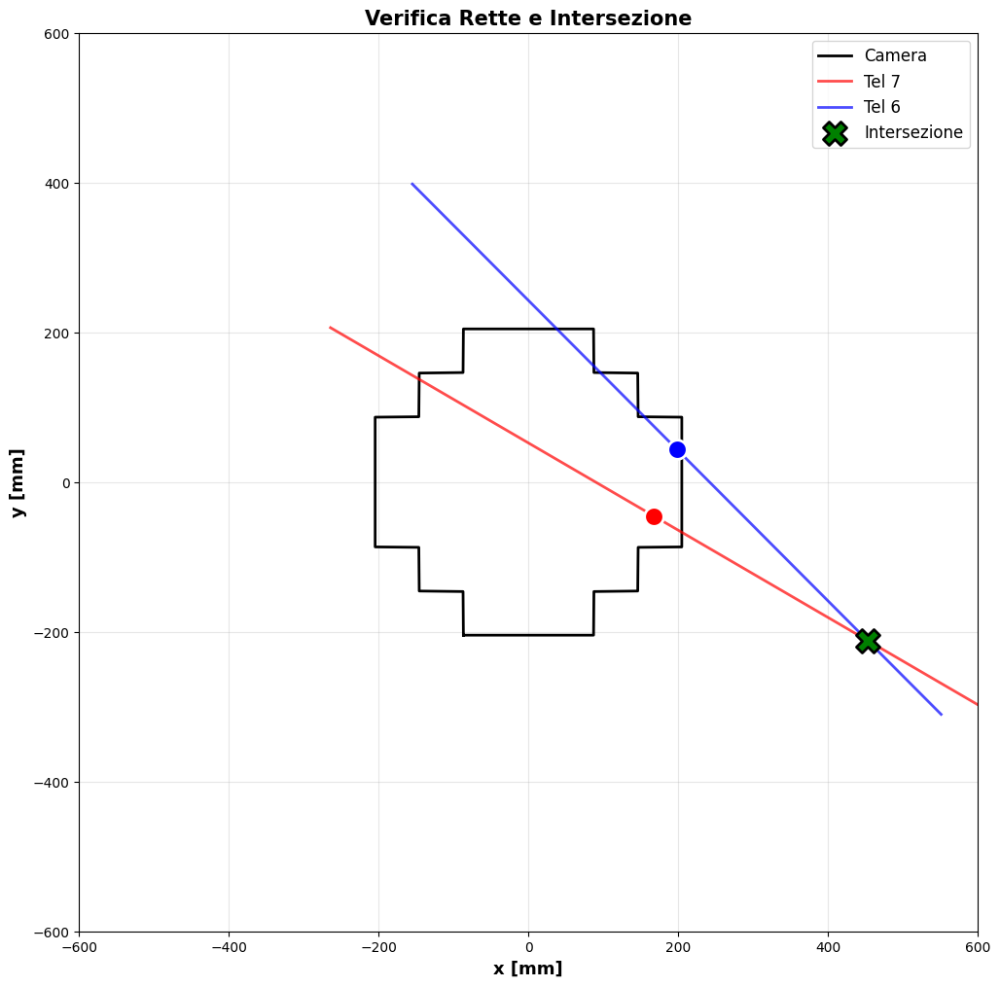

p1 (centroide Tel 7): [167.68607824 -45.55077889]
d1 (direzione Tel 7): [-0.86402294  0.50345245]
p2 (centroide Tel 6): [197.95151583  43.88242719]
d2 (direzione Tel 6): [-0.70593426  0.70827736]
Intersezione: [ 452.49141633 -211.50232732]


In [200]:
import matplotlib.pyplot as plt

# Prendi le prime due rette
p1 = np.array([167.68607824, -45.55077889])
d1 = np.array([-0.86402294, 0.50345245])
p2 = np.array([197.95151583, 43.88242719])
d2 = np.array([-0.70593426, 0.70827736])

# Plotta le rette
fig, ax = plt.subplots(figsize=(12, 12))

# Camera footprint
xfp, yfp = at.utils.camera.get_xy_footprint()
ax.plot(xfp, yfp, 'k-', linewidth=2, label='Camera')

# Disegna le rette estese
t_vals = np.linspace(-500, 500, 100)

# Retta 1 (Tel 7)
line1 = p1[:, None] + d1[:, None] * t_vals
ax.plot(line1[0], line1[1], 'r-', linewidth=2, alpha=0.7, label='Tel 7')
ax.scatter(p1[0], p1[1], s=200, c='red', marker='o', edgecolor='white', linewidth=2, zorder=10)

# Retta 2 (Tel 6)
line2 = p2[:, None] + d2[:, None] * t_vals
ax.plot(line2[0], line2[1], 'b-', linewidth=2, alpha=0.7, label='Tel 6')
ax.scatter(p2[0], p2[1], s=200, c='blue', marker='o', edgecolor='white', linewidth=2, zorder=10)

# Intersezione calcolata
P_calc = np.array([452.49141633, -211.50232732])
ax.scatter(P_calc[0], P_calc[1], s=300, c='green', marker='X', edgecolor='black', linewidth=2, zorder=15, label='Intersezione')

ax.set_xlim(-600, 600)
ax.set_ylim(-600, 600)
ax.set_aspect('equal')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=12)
ax.set_xlabel('x [mm]', fontsize=13, fontweight='bold')
ax.set_ylabel('y [mm]', fontsize=13, fontweight='bold')
ax.set_title('Verifica Rette e Intersezione', fontsize=15, fontweight='bold')
plt.show()

print(f"p1 (centroide Tel 7): {p1}")
print(f"d1 (direzione Tel 7): {d1}")
print(f"p2 (centroide Tel 6): {p2}")
print(f"d2 (direzione Tel 6): {d2}")
print(f"Intersezione: {P_calc}")

In [201]:
'''
df_evt_392 = dfR[dfR['time_group'] == 1669] #perche ho solo due telescopi dello stesso evento?
print(f"time_group{1669} ha {len(df_evt_392)} rette")
print(f"Telescopi: {df_evt_392['HG'].apply(lambda r: r['tel']).tolist()}")

# Visualizza tutti i dati del gruppo
print("\nDati completi:")
print(df_evt_392)
df_linked_events[df_linked_events['time_group']==1669]
'''
df_merged[df_merged['time_group'] == 957]




,TIME_NS,TIME_S,TIME_ABS,EVENT,MCRUN,TEL_ID,num_tel,HG,LG,TTP,...,same_event,same_mcrun,same_event_mcrun,window_type,assigned_cluster,is_assigned,min_distance,n_clusters_available,P_median,P_weight
68,628410920,0,628410920,18216,220026,9,1,"[[2146, 2178, 2189, 2197, 2221, 2261, 2129, 21...","[[2129, 2131, 2131, 2132, 2133, 2135, 2128, 21...","[[255, 138, 255, 255, 255, 255, 255, 255, 255,...",...,False,True,False,None,1,True,0.000000e+00,5,"[369.159007363416, -145.0788257362816]","[379.3867311184744, -156.34547659960097]"
69,628415839,0,628415839,18901,220026,1,7,"[[2154, 2073, 2119, 2332, 2166, 2179, 2161, 21...","[[2129, 2125, 2128, 2138, 2130, 2131, 2130, 21...","[[255, 255, 255, 90, 255, 255, 255, 255, 255, ...",...,False,True,False,diff_window,0,True,1.421085e-14,5,"[141.738251436792, 105.44321782499321]","[141.738251436792, 105.44321782499321]"
70,628416114,0,628416114,18901,220026,2,7,"[[2217, 2222, 2190, 2115, 2084, 2225, 2321, 23...","[[2132, 2133, 2131, 2127, 2126, 2133, 2138, 21...","[[255, 255, 255, 255, 255, 255, 64, 57, 255, 2...",...,True,True,True,same_window,4,True,1.693766e+00,5,"[-59.04511936026729, -181.80248908599384]","[-59.69266110847134, -183.59925270194168]"
71,628416153,0,628416153,18901,220026,4,7,"[[2741, 2370, 2492, 2424, 2417, 2263, 2086, 21...","[[2159, 2140, 2146, 2143, 2143, 2135, 2126, 21...","[[55, 61, 57, 58, 60, 68, 255, 255, 56, 58, 54...",...,True,True,True,same_window,2,True,0.000000e+00,5,"[1733.4961507100334, -1648.0046596827015]","[1733.4961507100334, -1648.0046596827017]"
72,628416159,0,628416159,18901,220026,3,7,"[[2606, 2613, 2757, 3248, 4095, 4095, 4095, 40...","[[2152, 2152, 2160, 2184, 2258, 2343, 2397, 24...","[[59, 58, 59, 56, 55, 55, 55, 54, 0, 58, 56, 5...",...,True,True,True,same_window,1,True,3.552714e-15,5,"[369.159007363416, -145.0788257362816]","[379.3867311184744, -156.34547659960097]"
73,628416360,0,628416360,18901,220026,5,7,"[[2306, 2468, 2343, 2289, 2992, 4095, 4095, 32...","[[2137, 2145, 2139, 2136, 2171, 2337, 2258, 21...","[[60, 59, 62, 63, 58, 55, 55, 57, 26, 255, 61,...",...,True,True,True,same_window,3,True,0.000000e+00,5,"[1012.7637639551378, -854.060634411376]","[1012.7637639551378, -854.060634411376]"
74,628416387,0,628416387,18901,220026,6,7,"[[3179, 4095, 4095, 3836, 2830, 2631, 2217, 21...","[[2181, 2262, 2474, 2213, 2163, 2153, 2132, 21...","[[56, 54, 54, 55, 54, 57, 255, 255, 57, 55, 55...",...,True,True,True,same_window,4,True,1.476158e+01,5,"[-59.04511936026729, -181.80248908599384]","[-59.69266110847134, -183.59925270194168]"



TIME GROUP 52
Telescopi: 6 | Eventi MC: [47607 47611] | MCRUN: [220000]


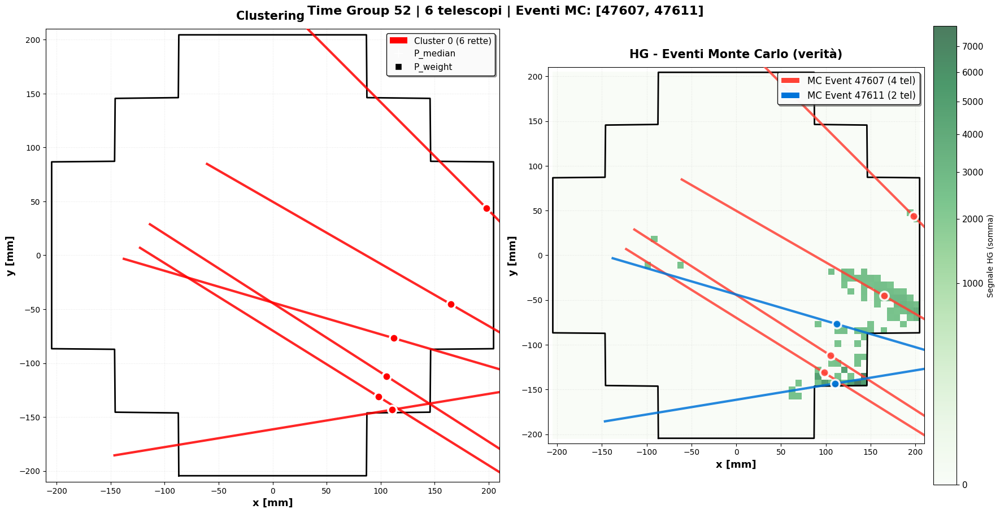

✓ Completato time_group 52
  Rette per evento MC: {47607: 4, 47611: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 6, -1: 0}


TIME GROUP 124
Telescopi: 5 | Eventi MC: [42510 42517] | MCRUN: [220003]


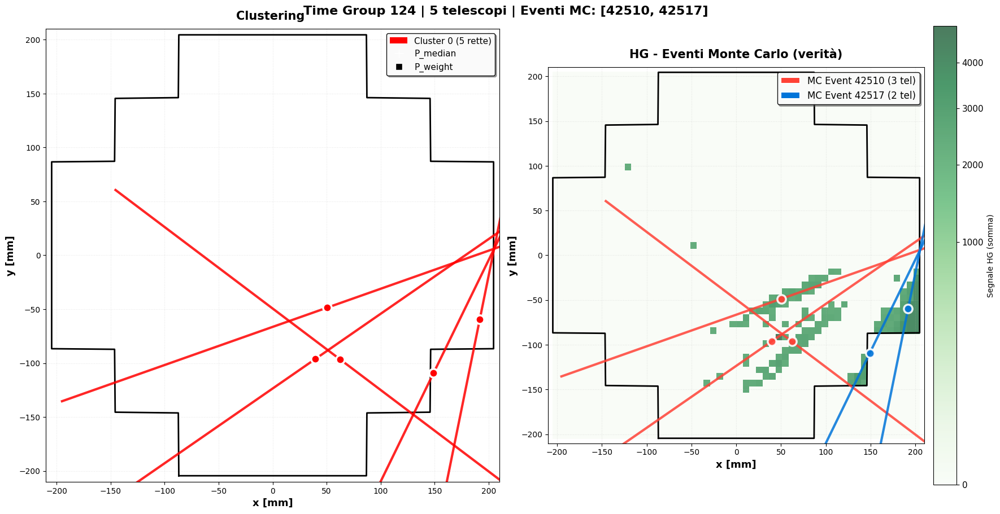

✓ Completato time_group 124
  Rette per evento MC: {42510: 3, 42517: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 5, -1: 0}


TIME GROUP 132
Telescopi: 7 | Eventi MC: [9500 9501] | MCRUN: [220004]


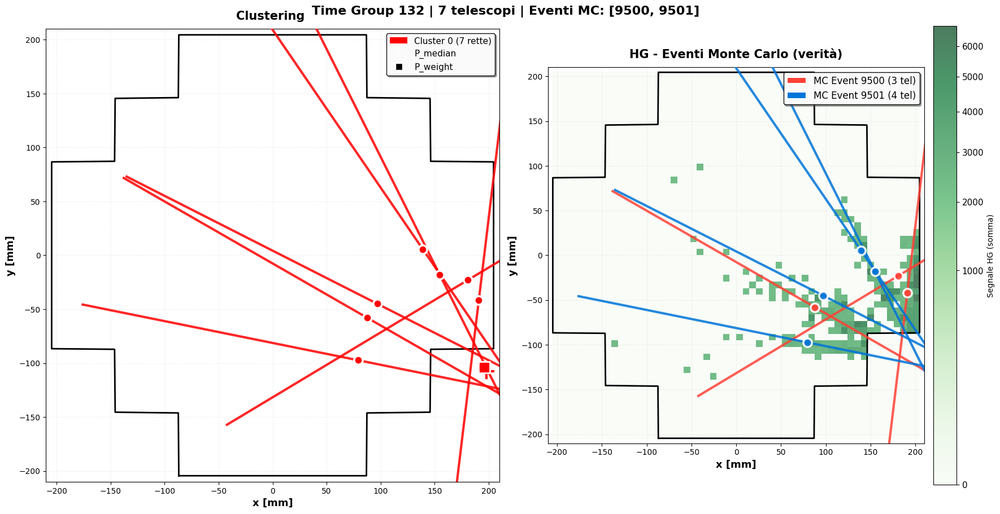

✓ Completato time_group 132
  Rette per evento MC: {9500: 3, 9501: 4}
  Cluster trovati: [0]
  Rette per cluster: {0: 7, -1: 0}


TIME GROUP 424
Telescopi: 9 | Eventi MC: [22907 22913] | MCRUN: [220012]


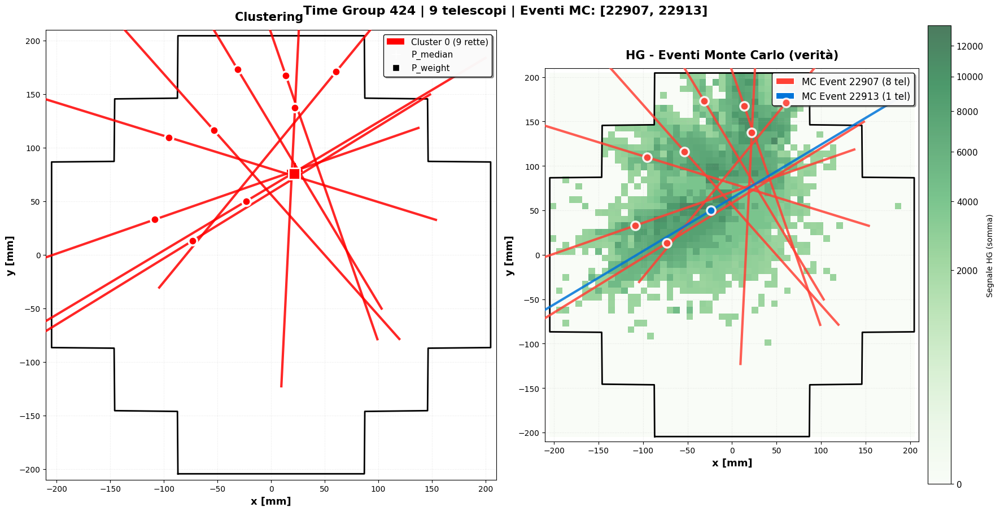

✓ Completato time_group 424
  Rette per evento MC: {22907: 8, 22913: 1}
  Cluster trovati: [0]
  Rette per cluster: {0: 9, -1: 0}


TIME GROUP 441
Telescopi: 7 | Eventi MC: [48900 48902] | MCRUN: [220012]


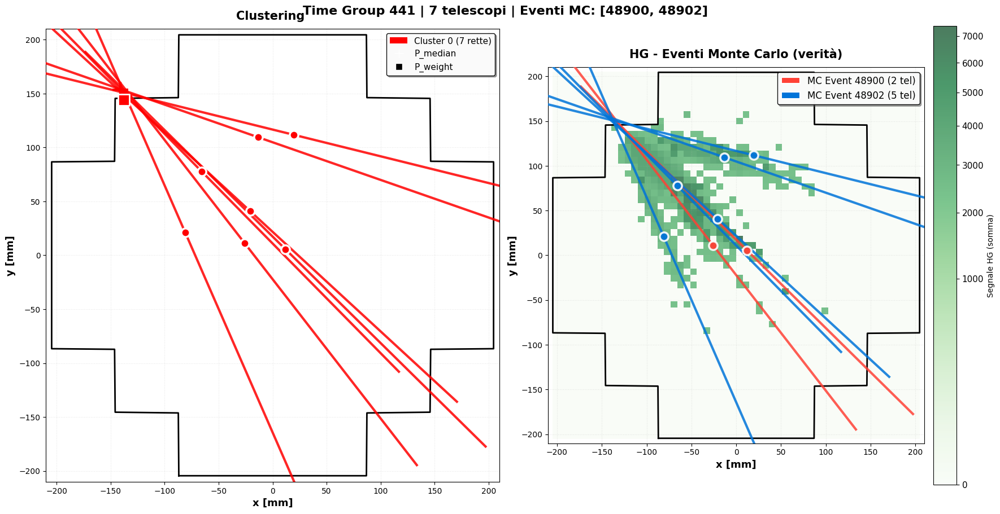

✓ Completato time_group 441
  Rette per evento MC: {48900: 2, 48902: 5}
  Cluster trovati: [0]
  Rette per cluster: {0: 7, -1: 0}


TIME GROUP 457
Telescopi: 5 | Eventi MC: [32506 32511] | MCRUN: [220013]


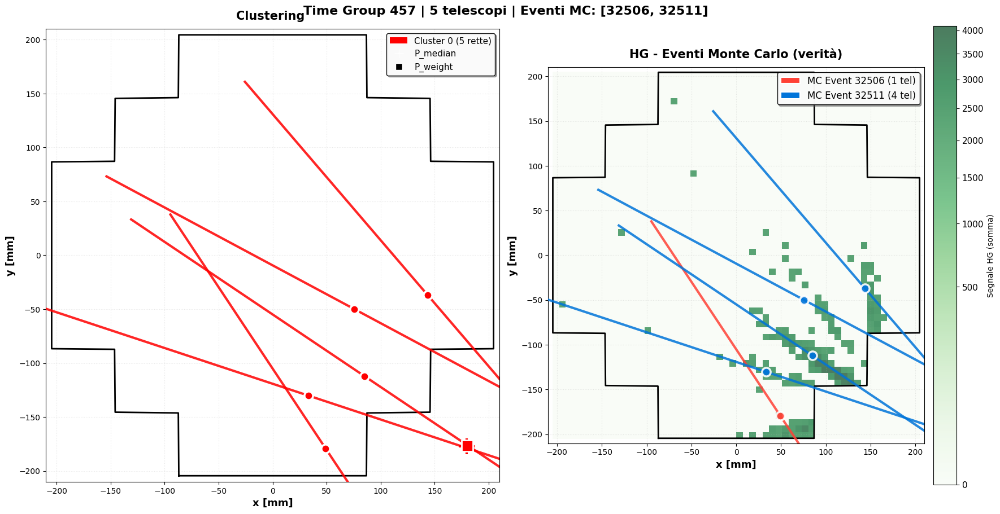

✓ Completato time_group 457
  Rette per evento MC: {32506: 1, 32511: 4}
  Cluster trovati: [0]
  Rette per cluster: {0: 5, -1: 0}


TIME GROUP 582
Telescopi: 6 | Eventi MC: [40503 40514] | MCRUN: [220016]


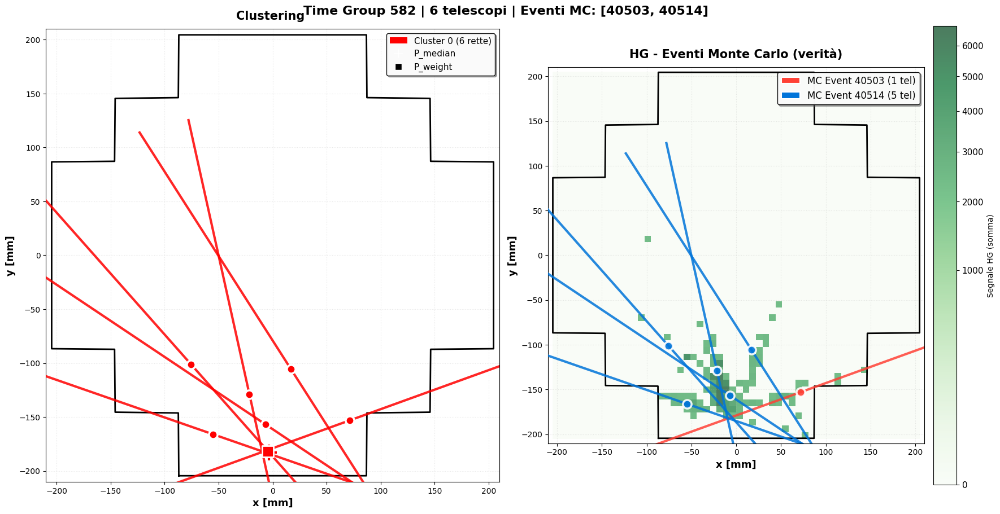

✓ Completato time_group 582
  Rette per evento MC: {40503: 1, 40514: 5}
  Cluster trovati: [0]
  Rette per cluster: {0: 6, -1: 0}


TIME GROUP 741
Telescopi: 5 | Eventi MC: [38811 38812] | MCRUN: [220020]


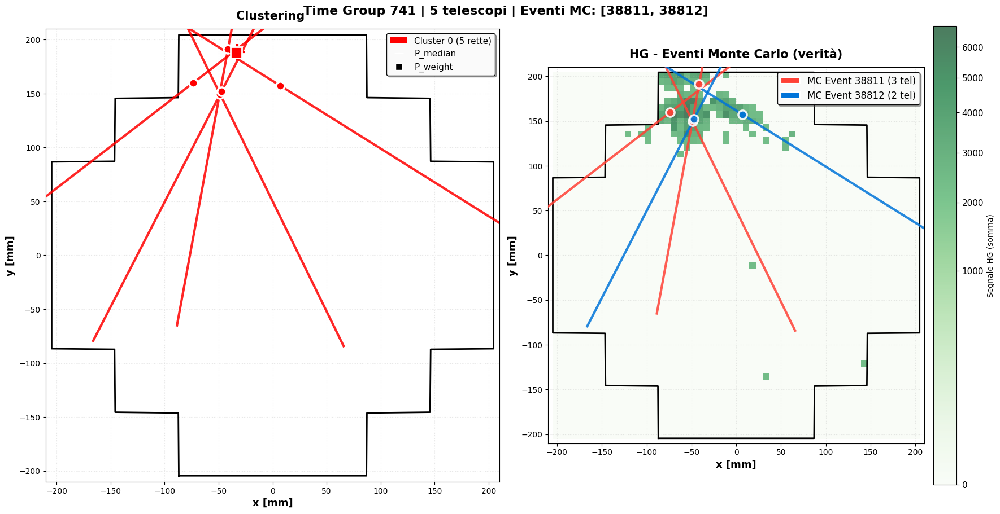

✓ Completato time_group 741
  Rette per evento MC: {38811: 3, 38812: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 5, -1: 0}


TIME GROUP 794
Telescopi: 4 | Eventi MC: [13315 13317] | MCRUN: [220022]


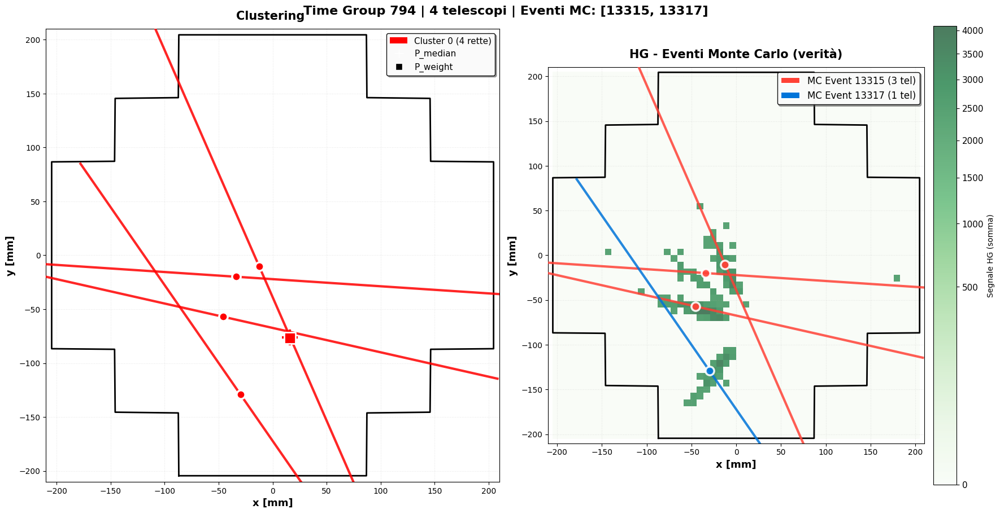

✓ Completato time_group 794
  Rette per evento MC: {13315: 3, 13317: 1}
  Cluster trovati: [0]
  Rette per cluster: {0: 4, -1: 0}


TIME GROUP 808
Telescopi: 8 | Eventi MC: [29518 29600] | MCRUN: [220022]


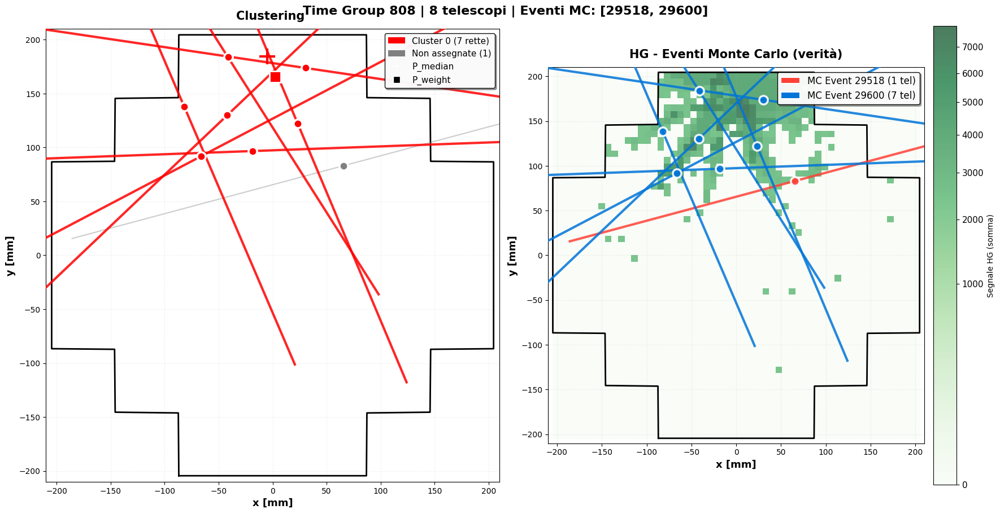

✓ Completato time_group 808
  Rette per evento MC: {29518: 1, 29600: 7}
  Cluster trovati: [0]
  Rette per cluster: {0: 7, -1: 1}


TIME GROUP 810
Telescopi: 6 | Eventi MC: [31019 31101] | MCRUN: [220022]


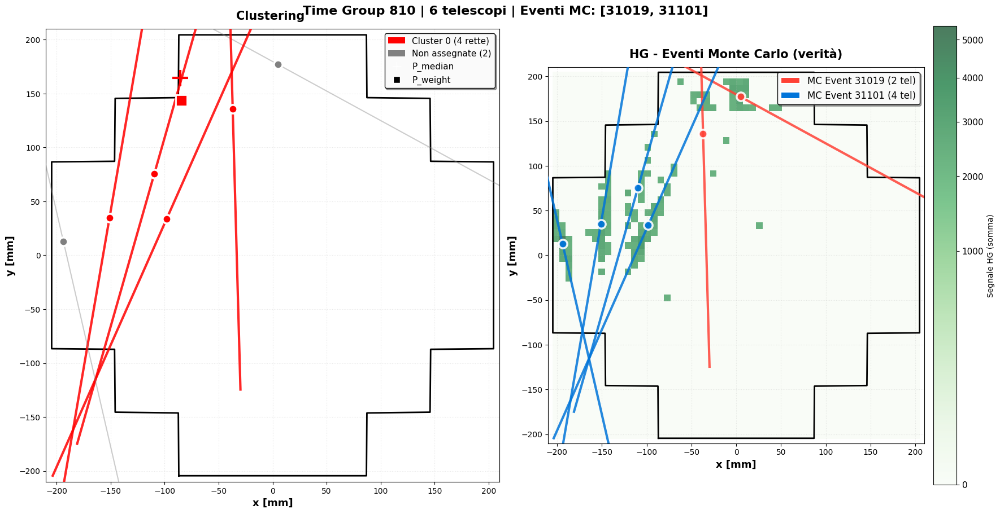

✓ Completato time_group 810
  Rette per evento MC: {31019: 2, 31101: 4}
  Cluster trovati: [0]
  Rette per cluster: {0: 4, -1: 2}


TIME GROUP 957
Telescopi: 7 | Eventi MC: [18216 18901] | MCRUN: [220026]


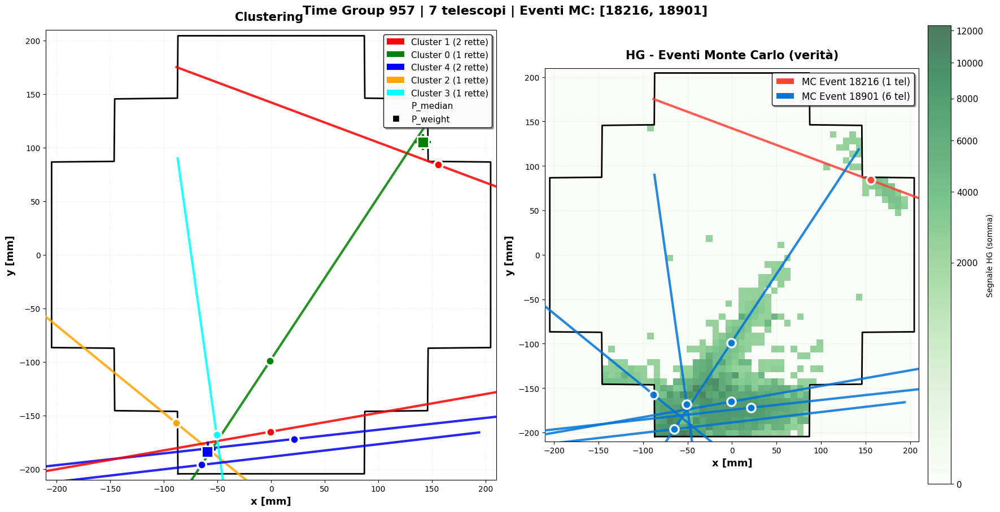

✓ Completato time_group 957
  Rette per evento MC: {18216: 1, 18901: 6}
  Cluster trovati: [1, 0, 4, 2, 3]
  Rette per cluster: {1: 2, 0: 1, 4: 2, 2: 1, 3: 1, -1: 0}


TIME GROUP 998
Telescopi: 6 | Eventi MC: [6502 6506] | MCRUN: [220027]


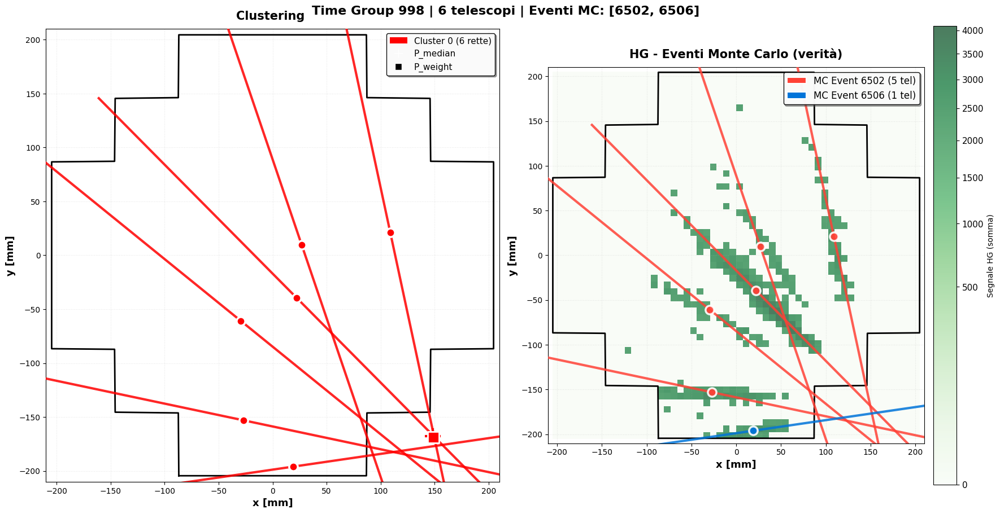

✓ Completato time_group 998
  Rette per evento MC: {6502: 5, 6506: 1}
  Cluster trovati: [0]
  Rette per cluster: {0: 6, -1: 0}


TIME GROUP 1094
Telescopi: 3 | Eventi MC: [39002 39006] | MCRUN: [220029]


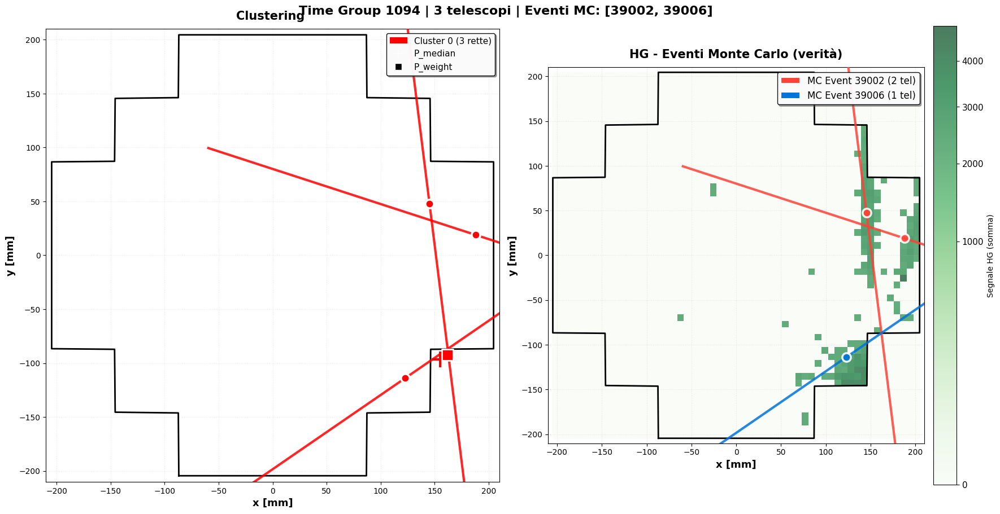

✓ Completato time_group 1094
  Rette per evento MC: {39002: 2, 39006: 1}
  Cluster trovati: [0]
  Rette per cluster: {0: 3, -1: 0}


TIME GROUP 1280
Telescopi: 4 | Eventi MC: [25108 25109] | MCRUN: [220034]


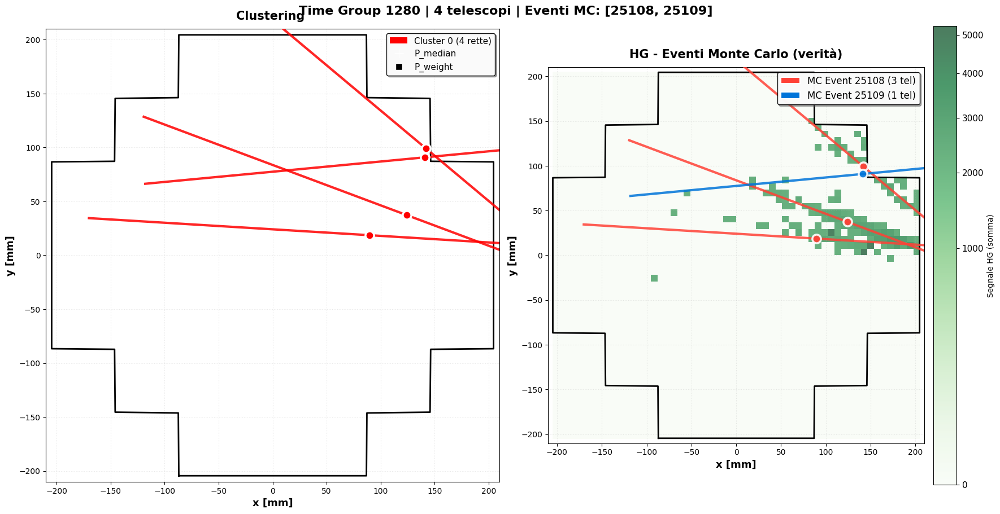

✓ Completato time_group 1280
  Rette per evento MC: {25108: 3, 25109: 1}
  Cluster trovati: [0]
  Rette per cluster: {0: 4, -1: 0}


TIME GROUP 1421
Telescopi: 8 | Eventi MC: [47109 47111] | MCRUN: [220038]


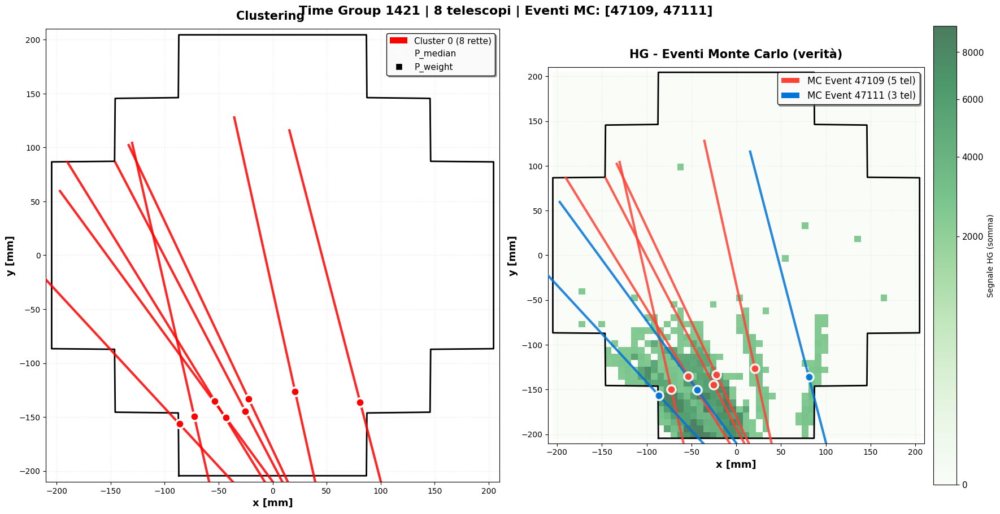

✓ Completato time_group 1421
  Rette per evento MC: {47109: 5, 47111: 3}
  Cluster trovati: [0]
  Rette per cluster: {0: 8, -1: 0}


TIME GROUP 1436
Telescopi: 3 | Eventi MC: [24606 24609] | MCRUN: [220039]


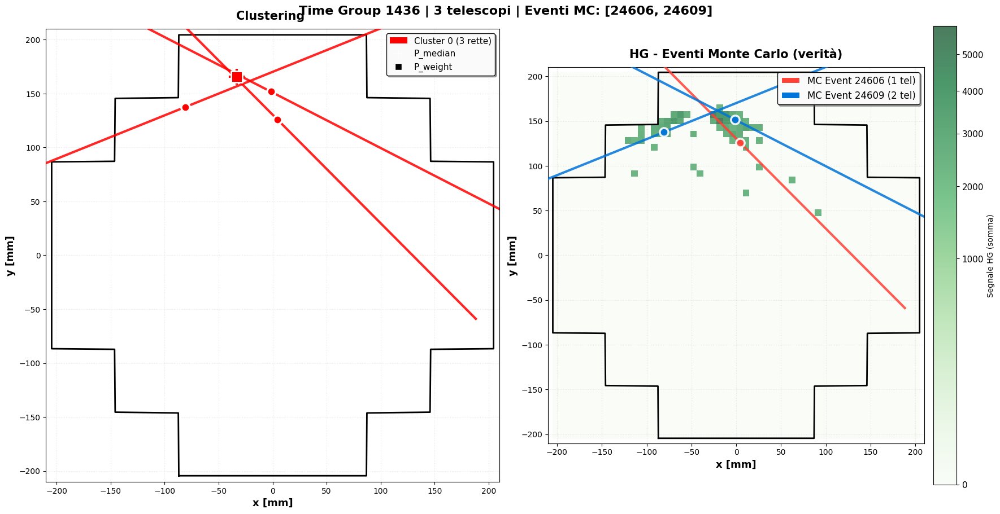

✓ Completato time_group 1436
  Rette per evento MC: {24606: 1, 24609: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 3, -1: 0}


TIME GROUP 1534
Telescopi: 9 | Eventi MC: [8207 8208] | MCRUN: [220042]


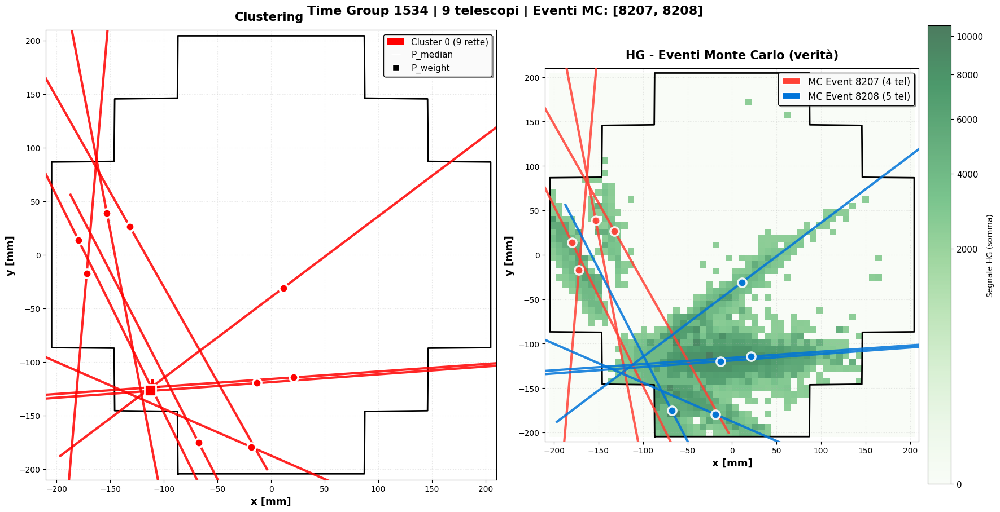

✓ Completato time_group 1534
  Rette per evento MC: {8207: 4, 8208: 5}
  Cluster trovati: [0]
  Rette per cluster: {0: 9, -1: 0}


TIME GROUP 1554
Telescopi: 4 | Eventi MC: [31816 33105] | MCRUN: [220042]


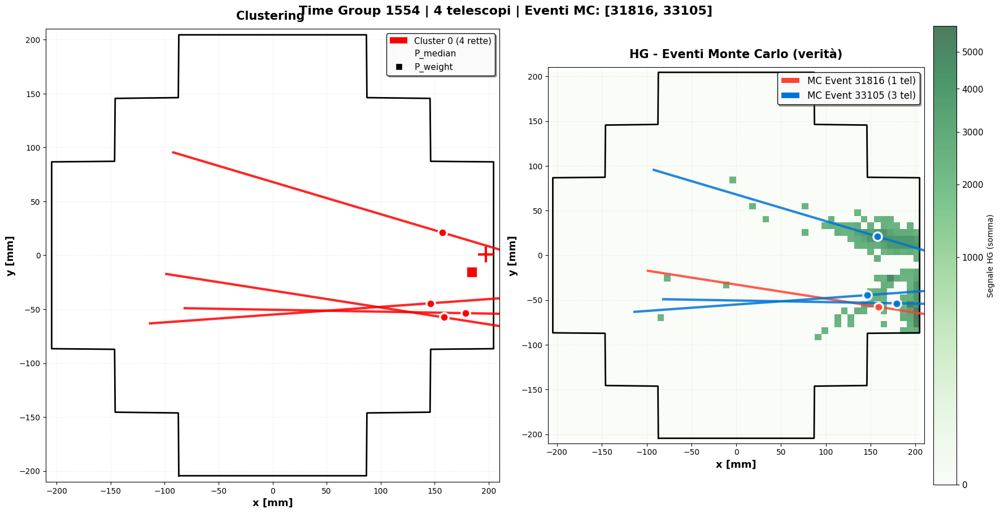

✓ Completato time_group 1554
  Rette per evento MC: {31816: 1, 33105: 3}
  Cluster trovati: [0]
  Rette per cluster: {0: 4, -1: 0}


TIME GROUP 1670
Telescopi: 3 | Eventi MC: [4108] | MCRUN: [220046]


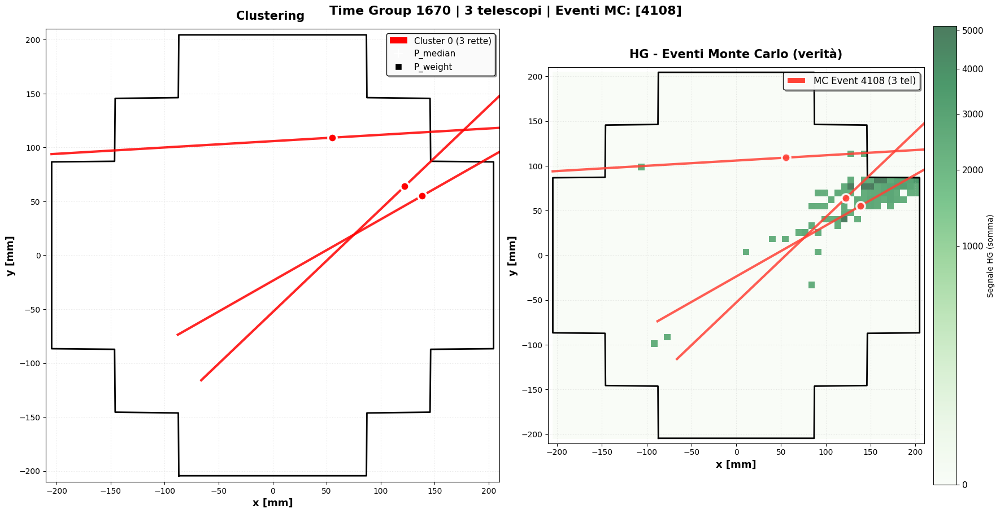

✓ Completato time_group 1670
  Rette per evento MC: {4108: 3}
  Cluster trovati: [0]
  Rette per cluster: {0: 3, -1: 0}


TIME GROUP 1873
Telescopi: 3 | Eventi MC: [13307 13308] | MCRUN: [220251]


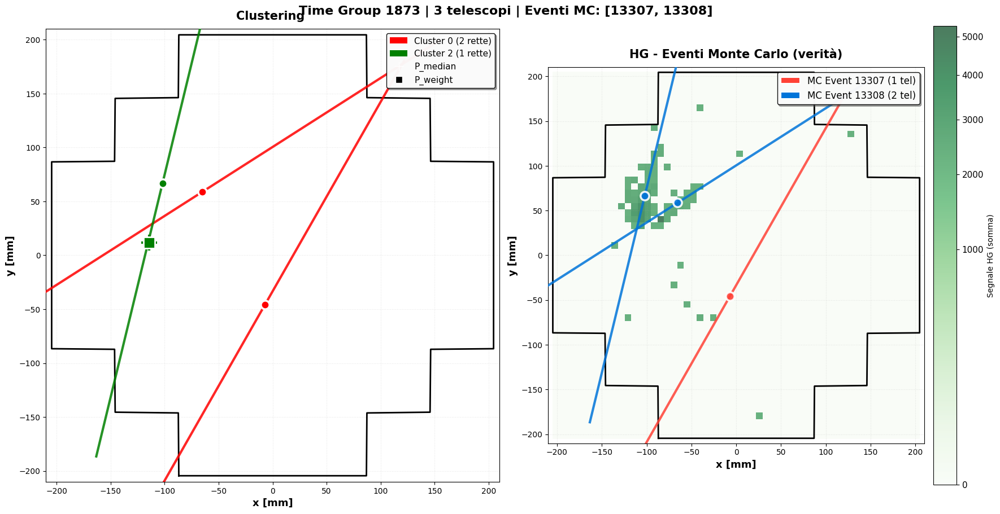

✓ Completato time_group 1873
  Rette per evento MC: {13307: 1, 13308: 2}
  Cluster trovati: [0, 2]
  Rette per cluster: {0: 2, 2: 1, -1: 0}


TIME GROUP 1925
Telescopi: 8 | Eventi MC: [41005 41008] | MCRUN: [220252]


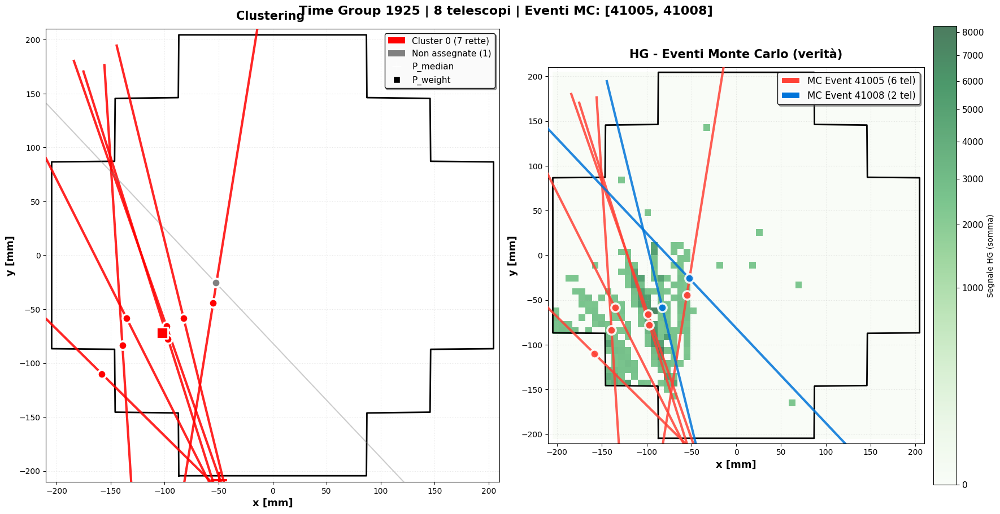

✓ Completato time_group 1925
  Rette per evento MC: {41005: 6, 41008: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 7, -1: 1}


TIME GROUP 1939
Telescopi: 7 | Eventi MC: [28808 29600] | MCRUN: [220253]


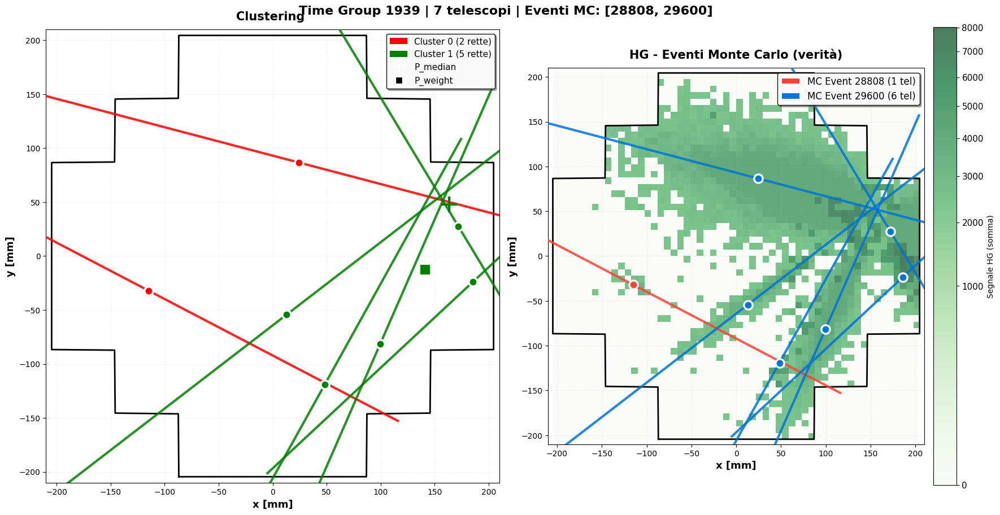

✓ Completato time_group 1939
  Rette per evento MC: {28808: 1, 29600: 6}
  Cluster trovati: [0, 1]
  Rette per cluster: {0: 2, 1: 5, -1: 0}


TIME GROUP 2074
Telescopi: 6 | Eventi MC: [36317 36906] | MCRUN: [220256]


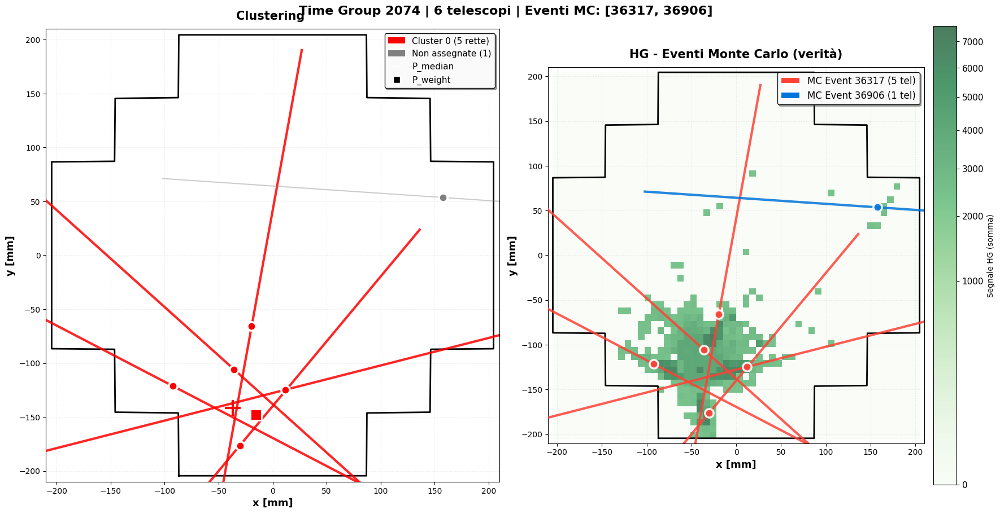

✓ Completato time_group 2074
  Rette per evento MC: {36317: 5, 36906: 1}
  Cluster trovati: [0]
  Rette per cluster: {0: 5, -1: 1}


TIME GROUP 2307
Telescopi: 8 | Eventi MC: [9406 9407] | MCRUN: [220263]


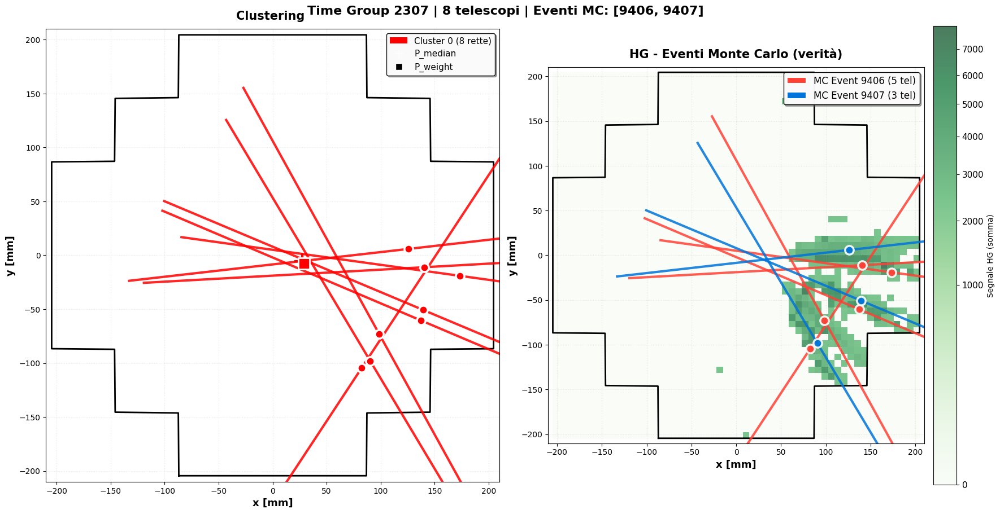

✓ Completato time_group 2307
  Rette per evento MC: {9406: 5, 9407: 3}
  Cluster trovati: [0]
  Rette per cluster: {0: 8, -1: 0}


TIME GROUP 2384
Telescopi: 3 | Eventi MC: [28701 28706] | MCRUN: [220265]


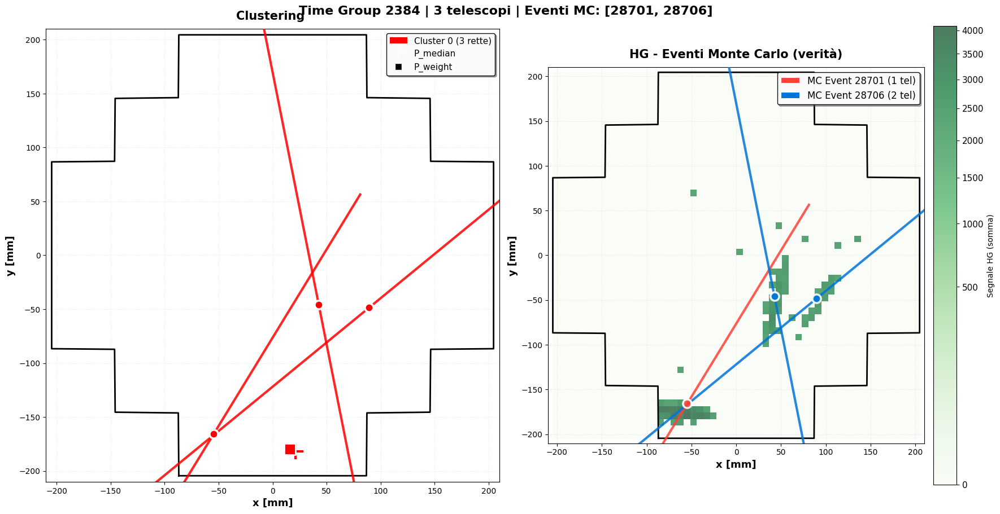

✓ Completato time_group 2384
  Rette per evento MC: {28701: 1, 28706: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 3, -1: 0}


TIME GROUP 2393
Telescopi: 4 | Eventi MC: [37408 37409] | MCRUN: [220265]


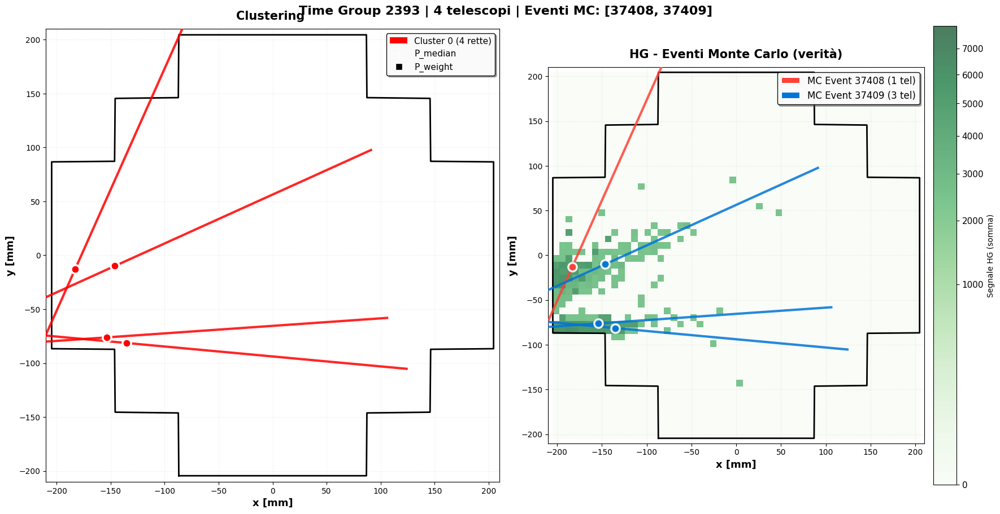

✓ Completato time_group 2393
  Rette per evento MC: {37408: 1, 37409: 3}
  Cluster trovati: [0]
  Rette per cluster: {0: 4, -1: 0}


TIME GROUP 2413
Telescopi: 8 | Eventi MC: [21214 21404] | MCRUN: [220266]


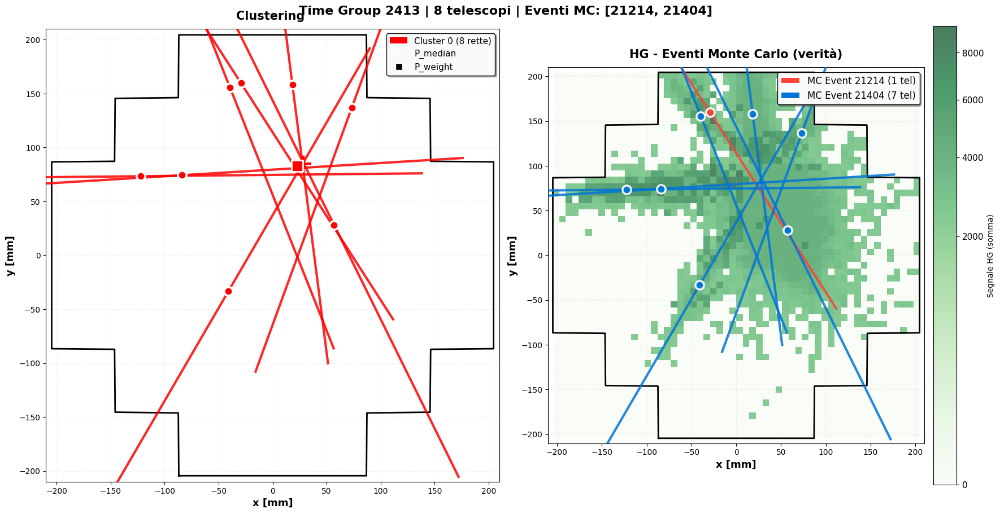

✓ Completato time_group 2413
  Rette per evento MC: {21214: 1, 21404: 7}
  Cluster trovati: [0]
  Rette per cluster: {0: 8, -1: 0}


TIME GROUP 2415
Telescopi: 3 | Eventi MC: [22310 22316] | MCRUN: [220266]


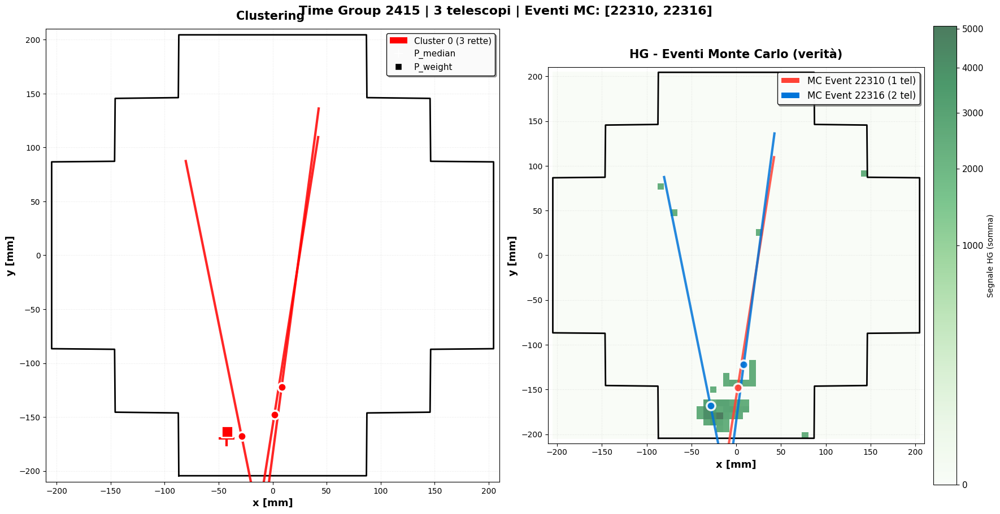

✓ Completato time_group 2415
  Rette per evento MC: {22310: 1, 22316: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 3, -1: 0}


TIME GROUP 2467
Telescopi: 3 | Eventi MC: [43007 42517] | MCRUN: [220267]


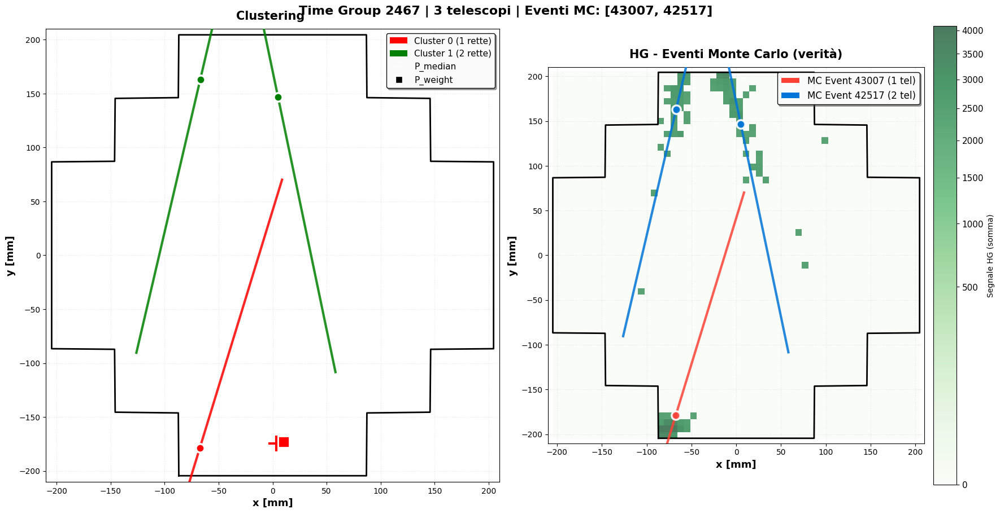

✓ Completato time_group 2467
  Rette per evento MC: {43007: 1, 42517: 2}
  Cluster trovati: [0, 1]
  Rette per cluster: {0: 1, 1: 2, -1: 0}


TIME GROUP 2472
Telescopi: 9 | Eventi MC: [8501 8514] | MCRUN: [220268]


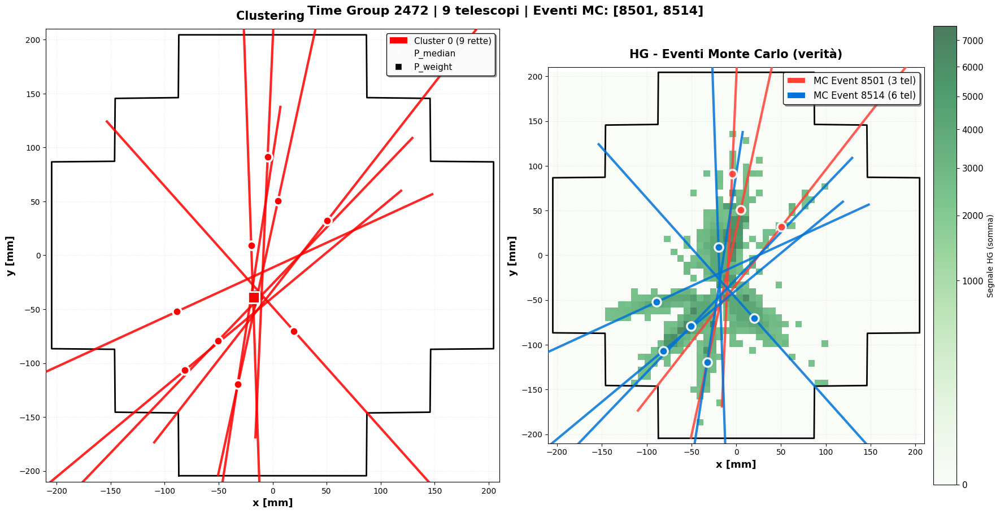

✓ Completato time_group 2472
  Rette per evento MC: {8501: 3, 8514: 6}
  Cluster trovati: [0]
  Rette per cluster: {0: 9, -1: 0}


TIME GROUP 2534
Telescopi: 6 | Eventi MC: [41912 41913] | MCRUN: [220269]


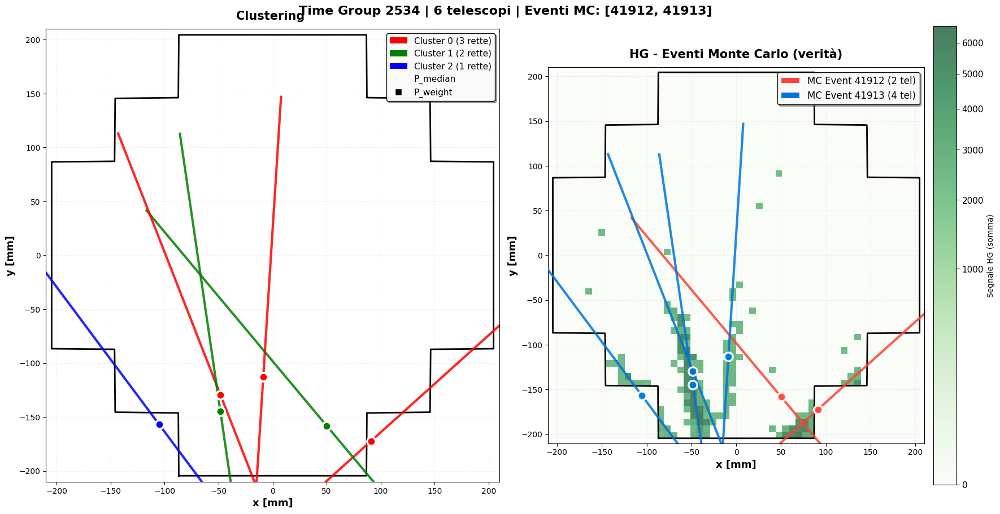

✓ Completato time_group 2534
  Rette per evento MC: {41912: 2, 41913: 4}
  Cluster trovati: [0, 1, 2]
  Rette per cluster: {0: 3, 1: 2, 2: 1, -1: 0}


TIME GROUP 2597
Telescopi: 4 | Eventi MC: [38505 38716] | MCRUN: [220271]


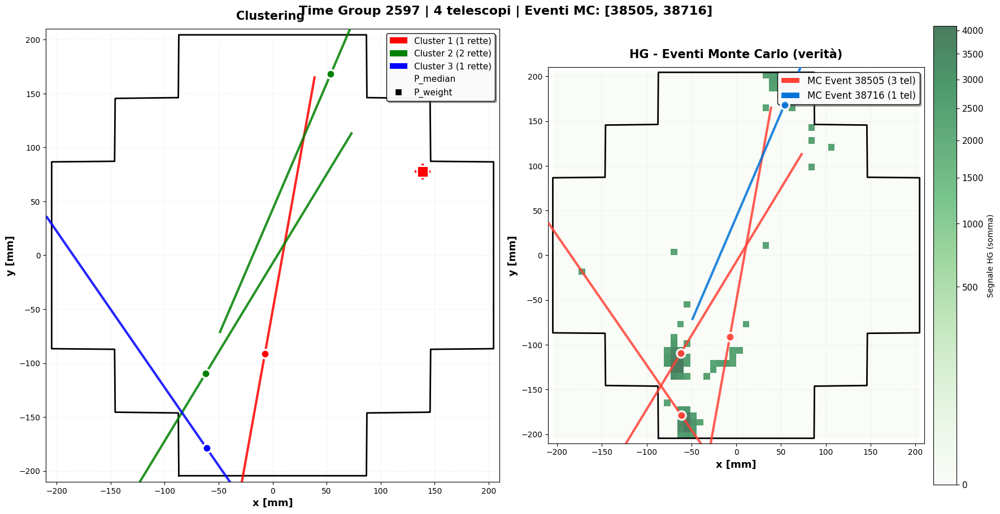

✓ Completato time_group 2597
  Rette per evento MC: {38505: 3, 38716: 1}
  Cluster trovati: [1, 2, 3]
  Rette per cluster: {1: 1, 2: 2, 3: 1, -1: 0}


TIME GROUP 2615
Telescopi: 9 | Eventi MC: [10106 10109] | MCRUN: [220272]


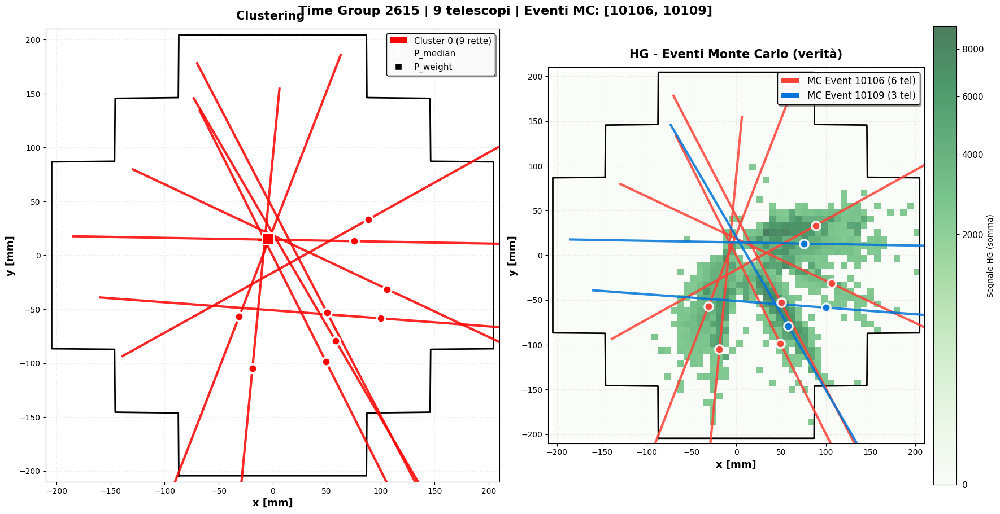

✓ Completato time_group 2615
  Rette per evento MC: {10106: 6, 10109: 3}
  Cluster trovati: [0]
  Rette per cluster: {0: 9, -1: 0}


TIME GROUP 2645
Telescopi: 8 | Eventi MC: [1713 1714] | MCRUN: [220273]


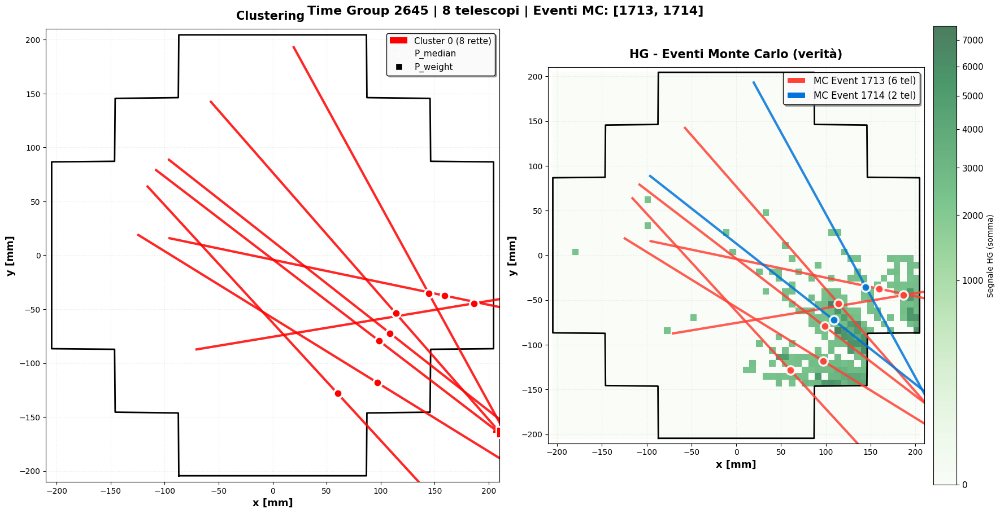

✓ Completato time_group 2645
  Rette per evento MC: {1713: 6, 1714: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 8, -1: 0}


TIME GROUP 2715
Telescopi: 6 | Eventi MC: [43007 43015] | MCRUN: [220274]


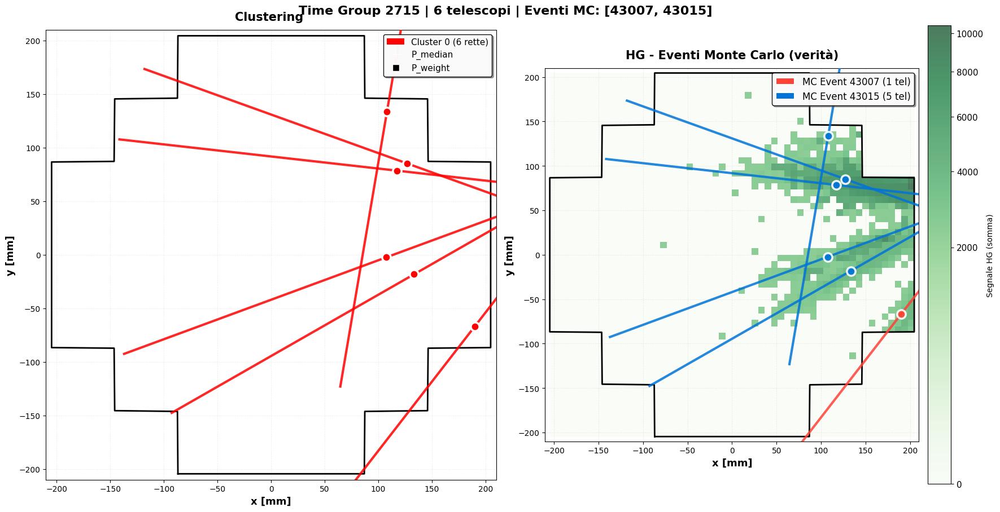

✓ Completato time_group 2715
  Rette per evento MC: {43007: 1, 43015: 5}
  Cluster trovati: [0]
  Rette per cluster: {0: 6, -1: 0}


TIME GROUP 2745
Telescopi: 9 | Eventi MC: [7515 7518] | MCRUN: [220276]


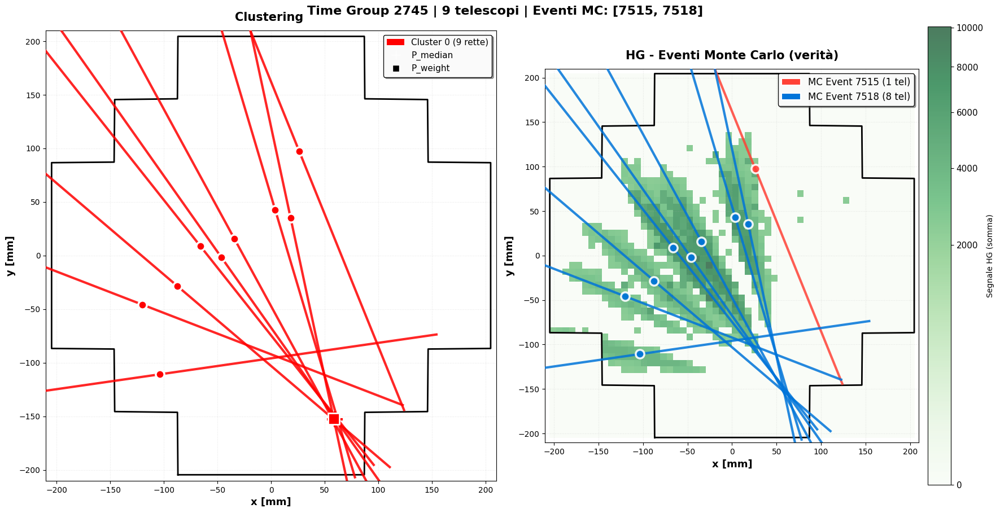

✓ Completato time_group 2745
  Rette per evento MC: {7515: 1, 7518: 8}
  Cluster trovati: [0]
  Rette per cluster: {0: 9, -1: 0}


TIME GROUP 2757
Telescopi: 9 | Eventi MC: [22501 22504] | MCRUN: [220276]


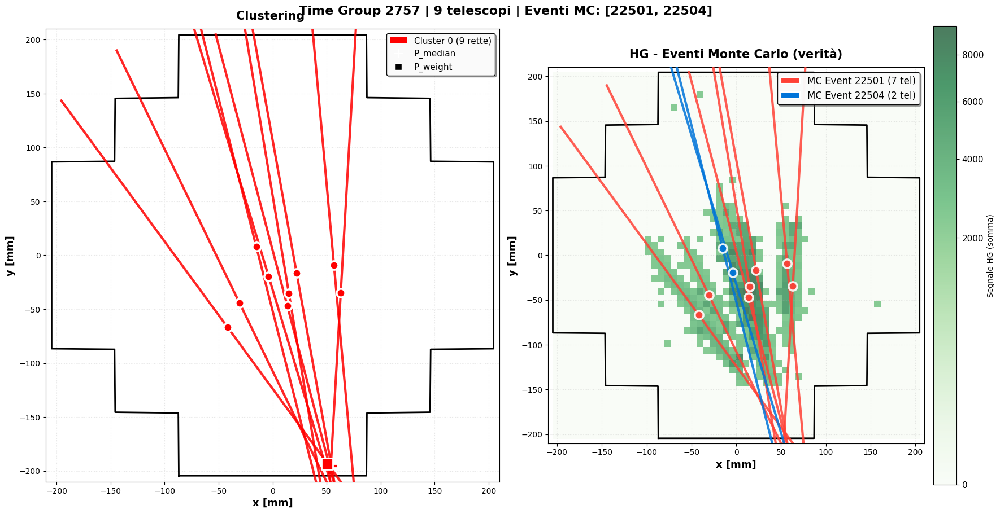

✓ Completato time_group 2757
  Rette per evento MC: {22501: 7, 22504: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 9, -1: 0}


TIME GROUP 2780
Telescopi: 3 | Eventi MC: [49312  1403] | MCRUN: [220276 220277]


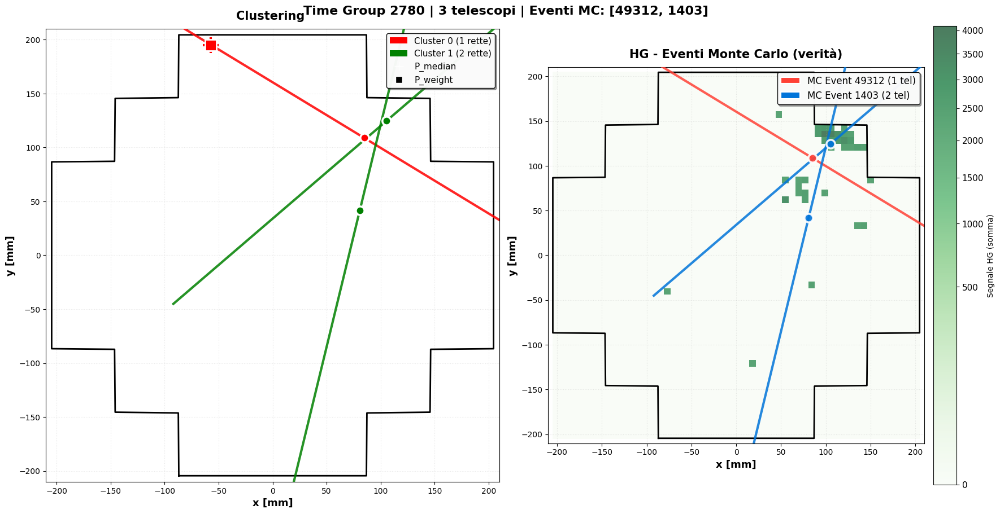

✓ Completato time_group 2780
  Rette per evento MC: {49312: 1, 1403: 2}
  Cluster trovati: [0, 1]
  Rette per cluster: {0: 1, 1: 2, -1: 0}


TIME GROUP 2997
Telescopi: 3 | Eventi MC: [40514 40603] | MCRUN: [220283]


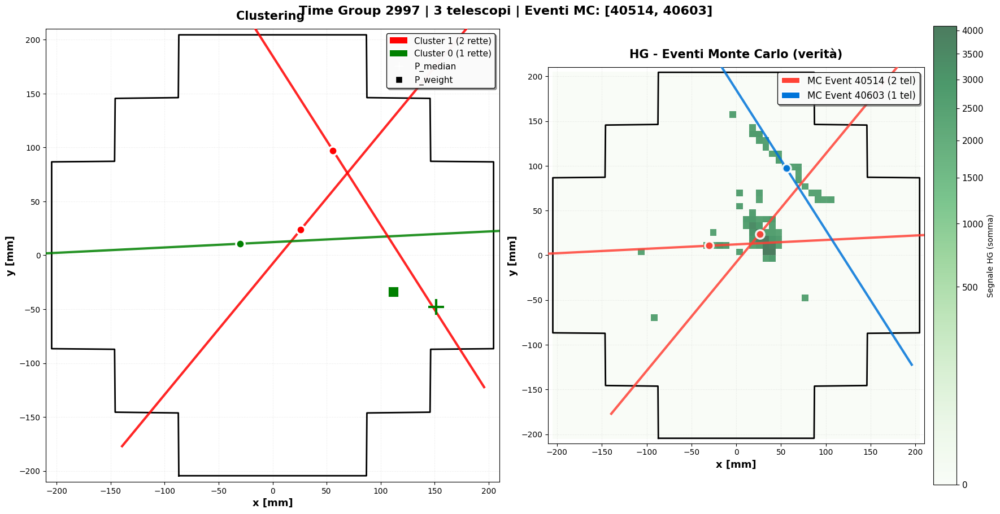

✓ Completato time_group 2997
  Rette per evento MC: {40514: 2, 40603: 1}
  Cluster trovati: [1, 0]
  Rette per cluster: {1: 2, 0: 1, -1: 0}


TIME GROUP 3369
Telescopi: 3 | Eventi MC: [30417 31003] | MCRUN: [220293]


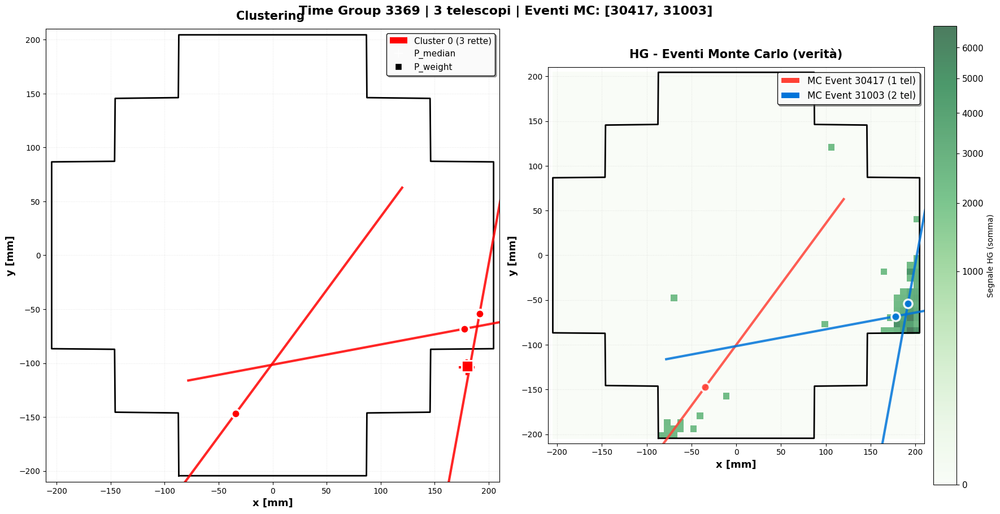

✓ Completato time_group 3369
  Rette per evento MC: {30417: 1, 31003: 2}
  Cluster trovati: [0]
  Rette per cluster: {0: 3, -1: 0}


TIME GROUP 3528
Telescopi: 8 | Eventi MC: [12808 12810] | MCRUN: [220297]


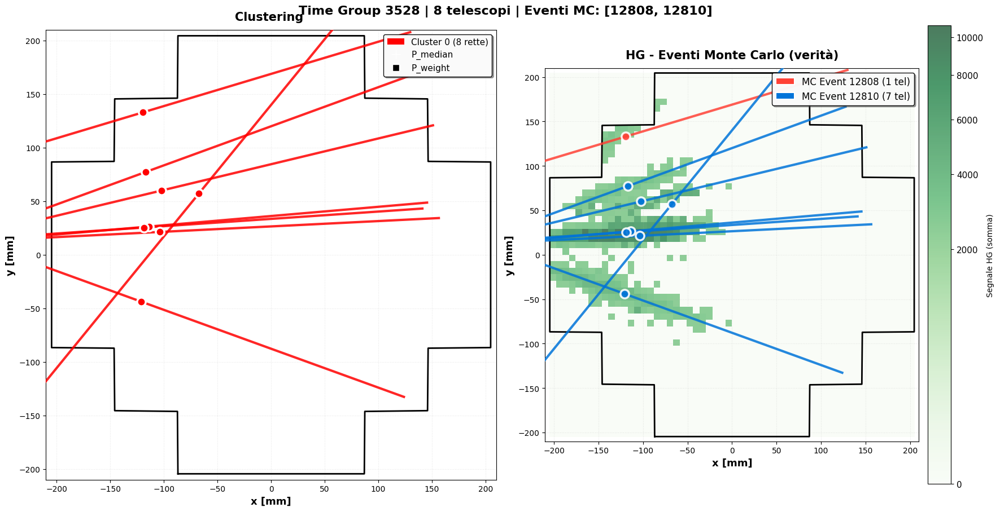

✓ Completato time_group 3528
  Rette per evento MC: {12808: 1, 12810: 7}
  Cluster trovati: [0]
  Rette per cluster: {0: 8, -1: 0}



In [202]:
from matplotlib.patches import Patch
from matplotlib.colors import PowerNorm
xfp, yfp = at.utils.camera.get_xy_footprint()
y_pix, x_pix = at.utils.camera.get_pixels_position_matrix().T
x_pix = at.reshape(x_pix)
y_pix = at.reshape(y_pix)

# Lunghezza rette
xmin, xmax = np.min(xfp), np.max(xfp)
ymin, ymax = np.min(yfp), np.max(yfp)
diag = np.sqrt((xmax - xmin)**2 + (ymax - ymin)**2)
L = 0.45 * diag

for time_group in df_merged['time_group'].drop_duplicates().values[:]:
    
    # ===================================================================
    # PREPARAZIONE DATI
    # ===================================================================
    
    # Estrai tutti i telescopi di questo gruppo temporale
    df_window = df_merged[df_merged['time_group'] == time_group].copy()
    
    # Informazioni sul gruppo
    unique_events = df_window['EVENT'].unique()
    unique_mcruns = df_window['MCRUN'].unique()
    
    print(f"\n{'='*70}")
    print(f"TIME GROUP {time_group}")
    print(f"Telescopi: {len(df_window)} | Eventi MC: {unique_events} | MCRUN: {unique_mcruns}")
    print(f"{'='*70}")
    
    # ===================================================================
    # PLOT SIDE-BY-SIDE
    # ===================================================================
    
    fig, ax = plt.subplots(1, 2, figsize=(18, 9))
    
    # Colori per cluster assegnati (il tuo metodo)
    cluster_trovati = df_window[df_window['is_assigned']]['assigned_cluster'].unique()
    colori_cluster = {cluster_trovati[i]: ['red', 'green', 'blue', 'orange', 'cyan'][i % 5] 
                     for i in range(len(cluster_trovati))}
    colori_cluster[-1] = 'gray'  # outliers
    
    # Colori per eventi MC
    colors_mc = ['#FF4136', '#0074D9', '#2ECC40', '#FF851B']
    event_color_map = {unique_events[i]: colors_mc[i % len(colors_mc)] for i in range(len(unique_events))}
    
    # Contatori
    rette_per_cluster = {c: 0 for c in cluster_trovati}
    rette_per_cluster[-1] = 0  # outliers
    rette_per_evento = {ev: 0 for ev in unique_events}
    
    # Inizializza array per heatmap
    weights_hg = np.zeros((37, 64))
    mask_tot = np.zeros((37, 64), dtype=bool)
    
    # Traccia quali baricentri sono già stati plottati per cluster
    baricentri_plottati = set()
    
    # ─── SINISTRA: CLUSTERING ───────────────────────────────────
    for idx, row in df_window.iterrows():
        
        hgev = np.array(row['HG'])
        ttpev = np.array(row['TTP'])
        pxmask = (hgev > 2400) & (ttpev < 255)
        centro0 = np.array(row['P_median'])
        centro1 = np.array(row['P_weight'])

        if not np.any(pxmask):
            continue
        
        # Centroide
        meanx_hg = np.average(x_pix[pxmask].flatten(), weights=hgev[pxmask].flatten())
        meany_hg = np.average(y_pix[pxmask].flatten(), weights=hgev[pxmask].flatten())
        
        # Covarianza per direzione
        cov_hg = np.cov([x_pix[pxmask].flatten(), y_pix[pxmask].flatten()], 
                        aweights=hgev[pxmask].flatten())
        l1_hg = (cov_hg[0,0] + cov_hg[1,1])/2 + np.sqrt(((cov_hg[0,0] - cov_hg[1,1])/2)**2 + cov_hg[0,1]**2)
        theta_hg = np.arctan2(l1_hg - cov_hg[0,0], cov_hg[0,1])
        
        # Cluster assegnato
        if row['is_assigned']:
            cluster_id = row['assigned_cluster']
            col = colori_cluster.get(cluster_id, 'purple')
            alpha = 0.85
            lw = 3.0
            rette_per_cluster[cluster_id] += 1
        else:
            col = 'gray'
            alpha = 0.4
            lw = 1.5
            rette_per_cluster[-1] += 1
        
        # Disegna retta
        x1 = meanx_hg - L * np.cos(theta_hg)
        y1 = meany_hg - L * np.sin(theta_hg)
        x2 = meanx_hg + L * np.cos(theta_hg)
        y2 = meany_hg + L * np.sin(theta_hg)
        
        ax[0].plot([x1, x2], [y1, y2], color=col, linewidth=lw, alpha=alpha, zorder=5)
        ax[0].scatter(meanx_hg, meany_hg, s=120, color=col, edgecolor='white', linewidth=2.5, zorder=6)

        # Plotta i baricentri solo una volta per cluster
        if row['is_assigned'] and cluster_id not in baricentri_plottati:
            if centro0.ndim == 1:
                # È un singolo punto
                ax[0].scatter(centro0[0], centro0[1], marker='+', s=400, c=col, 
                            linewidth=3, zorder=7)
                ax[0].scatter(centro1[0], centro1[1], marker='s', s=200, c=col, 
                            linewidth=2, zorder=7, edgecolor='white')
            elif centro0.ndim == 2:
                # Sono multipli punti
                ax[0].scatter(centro0[:, 0], centro0[:, 1], marker='+', s=400, c=col, 
                            linewidth=3, zorder=7)
                ax[0].scatter(centro1[:, 0], centro1[:, 1], marker='s', s=200, c=col, 
                            linewidth=2, zorder=7, edgecolor='white')
            
            baricentri_plottati.add(cluster_id)
            
    # Disegna centri cluster (se presenti in df_window)
    for cluster_id in cluster_trovati:
        cluster_rows = df_window[df_window['assigned_cluster'] == cluster_id]
        if len(cluster_rows) > 0 and 'center_x' in cluster_rows.columns:
            center_x = cluster_rows['center_x'].iloc[0]
            center_y = cluster_rows['center_y'].iloc[0]
            ax[0].scatter(center_x, center_y, marker='+', s=500, 
                         c=colori_cluster.get(cluster_id, 'black'), linewidth=4, zorder=7)
    
    ax[0].plot(xfp, yfp, 'k-', linewidth=2, zorder=2)
    ax[0].set_title(f'Clustering ', fontweight='bold', fontsize=15, pad=12)
    ax[0].set_xlim(-210, 210)
    ax[0].set_ylim(-210, 210)
    ax[0].set_aspect('equal')
    ax[0].set_xlabel('x [mm]', fontsize=13, fontweight='bold')
    ax[0].set_ylabel('y [mm]', fontsize=13, fontweight='bold')
    ax[0].grid(True, alpha=0.3, linestyle=':', linewidth=0.8)
    
    # Legenda clustering
    legend_clustering = []
    for c in cluster_trovati:
        if rette_per_cluster[c] > 0:
            legend_clustering.append(Patch(facecolor=colori_cluster[c], 
                                          label=f'Cluster {c} ({rette_per_cluster[c]} rette)'))
    if rette_per_cluster[-1] > 0:
        legend_clustering.append(Patch(facecolor='gray', 
                                      label=f'Non assegnate ({rette_per_cluster[-1]})'))
    # Aggiungi simboli baricentri alla legenda
    from matplotlib.lines import Line2D
    legend_clustering.append(Line2D([0], [0], marker='+', color='w', markerfacecolor='black', 
                                   markersize=12, label='P_median', linewidth=0))
    legend_clustering.append(Line2D([0], [0], marker='s', color='w', markerfacecolor='black', 
                                   markersize=8, label='P_weight', linewidth=0, markeredgecolor='white'))
    
    ax[0].legend(handles=legend_clustering, loc='upper right', fontsize=11, 
                framealpha=0.95, edgecolor='black', fancybox=True, shadow=True)
    
    # ─── DESTRA: HG CON EVENTI MC ─────────────────────────────────────
    for idx, row in df_window.iterrows():
        
        hgev = np.array(row['HG'])
        ttpev = np.array(row['TTP'])
        pxmask = (hgev > 2400) & (ttpev < 255)
        
        if not np.any(pxmask):
            continue
        
        # Somma per heatmap
        weights_hg[pxmask] += hgev[pxmask]
        mask_tot |= pxmask
        
        # Centroide
        meanx_hg = np.average(x_pix[pxmask].flatten(), weights=hgev[pxmask].flatten())
        meany_hg = np.average(y_pix[pxmask].flatten(), weights=hgev[pxmask].flatten())
        
        # Covarianza
        cov_hg = np.cov([x_pix[pxmask].flatten(), y_pix[pxmask].flatten()], 
                        aweights=hgev[pxmask].flatten())
        l1_hg = (cov_hg[0,0] + cov_hg[1,1])/2 + np.sqrt(((cov_hg[0,0] - cov_hg[1,1])/2)**2 + cov_hg[0,1]**2)
        theta_hg = np.arctan2(l1_hg - cov_hg[0,0], cov_hg[0,1])
        
        color_ev = event_color_map[row['EVENT']]
        rette_per_evento[row['EVENT']] += 1
        
        ax[1].scatter(meanx_hg, meany_hg, s=120, color=color_ev, 
                     edgecolor='white', linewidth=2.5, zorder=6, alpha=0.9)
        
        x1 = meanx_hg - L * np.cos(theta_hg)
        y1 = meany_hg - L * np.sin(theta_hg)
        x2 = meanx_hg + L * np.cos(theta_hg)
        y2 = meany_hg + L * np.sin(theta_hg)
        ax[1].plot([x1, x2], [y1, y2], color=color_ev, linewidth=3, alpha=0.85, zorder=5)
    
    # Heatmap
    h1 = ax[1].hist2d(x_pix[mask_tot].flatten(), y_pix[mask_tot].flatten(),
                     weights=weights_hg[mask_tot].flatten(), 
                     range=((-205, 205), (-205, 205)),
                     bins=7*8, cmap='Greens', alpha=0.7, norm=PowerNorm(0.4))
    
    ax[1].plot(xfp, yfp, 'k-', linewidth=2, zorder=2)
    ax[1].set_xlim(-210, 210)
    ax[1].set_ylim(-210, 210)
    ax[1].set_aspect('equal')
    ax[1].set_xlabel('x [mm]', fontsize=13, fontweight='bold')
    ax[1].set_ylabel('y [mm]', fontsize=13, fontweight='bold')
    ax[1].grid(True, alpha=0.3, linestyle=':', linewidth=0.8)
    ax[1].set_title(f'HG - Eventi Monte Carlo (verità)', fontweight='bold', fontsize=15, pad=12)
    
    # Colorbar
    cbar1 = fig.colorbar(h1[3], ax=ax[1], label='Segnale HG (somma)', pad=0.02)
    cbar1.ax.tick_params(labelsize=11)
    
    # Legenda eventi MC
    legend_mc = [
        Patch(facecolor=event_color_map[ev], edgecolor='white', linewidth=1.5,
              label=f'MC Event {ev} ({rette_per_evento[ev]} tel)')
        for ev in unique_events
    ]
    ax[1].legend(handles=legend_mc, loc='upper right', fontsize=12, 
                framealpha=0.95, edgecolor='black', fancybox=True, shadow=True)
    
    plt.suptitle(f'Time Group {time_group} | {len(df_window)} telescopi | Eventi MC: {list(unique_events)}',
                fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()
    
    print(f"✓ Completato time_group {time_group}")
    print(f"  Rette per evento MC: {rette_per_evento}")
    print(f"  Cluster trovati: {list(cluster_trovati)}")
    print(f"  Rette per cluster: {rette_per_cluster}\n")